# Stimulation

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Stimulation" data-toc-modified-id="Stimulation-1">Stimulation</a></span><ul class="toc-item"><li><span><a href="#Setup" data-toc-modified-id="Setup-1.1">Setup</a></span></li><li><span><a href="#Final-single-node-stim-figure" data-toc-modified-id="Final-single-node-stim-figure-1.2">Final single-node stim figure</a></span></li><li><span><a href="#Final-regional-Io-modulation-figures" data-toc-modified-id="Final-regional-Io-modulation-figures-1.3">Final regional Io modulation figures</a></span><ul class="toc-item"><li><span><a href="#Run-sims-for-focal-stimulation" data-toc-modified-id="Run-sims-for-focal-stimulation-1.3.1">Run sims for focal stimulation</a></span></li><li><span><a href="#Plot-focal-changes-on-brains" data-toc-modified-id="Plot-focal-changes-on-brains-1.3.2">Plot focal changes on brains</a></span></li><li><span><a href="#Final-figure" data-toc-modified-id="Final-figure-1.3.3">Final figure</a></span></li></ul></li></ul></li></ul></div>

## Setup

Importage

In [1]:
%run ~/set_localenv_vars.py


# Generic stuff

import os,sys,glob,h5py,pandas as pd,numpy as np
from copy import deepcopy
from scipy.io import loadmat
from datetime import datetime

from scipy.spatial import cKDTree
from scipy.stats import zscore



# Neuroimaging stuff

import nibabel as nib
from mne.time_frequency import psd_welch
import hcp,mne

sys.path.append('/home/jgriffiths/Code/libraries_of_others/github/tvb-library')
sys.path.append('/home/jgriffiths/Code/libraries_of_others/github/tvb-data')
from tvb.simulator.lab import *

from nilearn.plotting import plot_surf_roi
import matplotlib as mpl


# Visualization stuff 

%matplotlib inline
from matplotlib import pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import seaborn as sns
from IPython.display import Image,clear_output,HTML
from moviepy.editor import ImageSequenceClip



# BSAC stuff

sys.path.append('../../')
from bsac.GL_model import (run_net_sim,decimate_surface,plot_surface_mpl,plot_surface_mpl_mv,
                           make_brain_movie,sim_summary,FreqVsAmpPsweep,)



/hecuba/mcintosh_lab/john/VM_Software/miniconda2/envs/jupyter/lib/python2.7/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


   INFO  log level set to INFO


In [2]:
from nilearn.plotting import plot_surf

Define some variables

In [3]:
cv = 4.

f = '/mnt/rotmangrid-scratch/mcintosh_lab/jgriffiths/Data/tshsothc_data/data/all_hcp_dwi_data.h5'
F = h5py.File(f, 'r')
F.close()

#df_weights = pd.DataFrame(weights)
#df_delays = pd.DataFrame(delays)

df_l2k8_w = pd.read_hdf(f, 'avg_weight_sc33_N711')
df_l2k8_w *= ((np.eye(83)*-1) + 1)
df_l2k8_wlog = np.log1p(df_l2k8_w)

df_l2k8_wlog_divmax = df_l2k8_wlog.copy()
df_l2k8_wlog_divmax/= df_l2k8_wlog.max()


df_l2k8_tl = pd.read_hdf(f, 'avg_tract_length_sc33_N711')
df_l2k8_tl = df_l2k8_tl + df_l2k8_tl.T

df_l2k8_del = df_l2k8_tl / cv

_df_d = df_l2k8_del.copy()
_df_d[df_l2k8_wlog_divmax<0.2] = 0.

_df_w = df_l2k8_wlog_divmax.copy()
_df_w[_df_w<0.2] = 0


l2k8_lV1_idx = 21 # pericalcarine
l2k8_lM1_idx = 24 # precentral
l2k8_lA1_idx = 30 # superiortemporal
l2k8_lS1_idx = 22 # postcentral
l2k8_lDLPFC_idx = 12 # lateralorbitofrontal
l2k8_lVLPFC_idx = 19 # parsorbitalis

focal_nodes = [l2k8_lV1_idx,l2k8_lA1_idx,l2k8_lM1_idx,l2k8_lS1_idx,
               l2k8_lDLPFC_idx,l2k8_lVLPFC_idx]
focal_node_names = ['lV1','lA1','lM1','lS1','lDLPFC','lVLPFC']


# low resolution = sparser set ('short')
freqs_s = np.arange(0.01,100.,10./3.)
amps_s = np.arange(0,3,0.1) 

# high resolution = denser set ('long')
freqs_l = np.arange(0,100,1)
amps_l = np.arange(0.,2.05,0.05)

# 1-node weights & delays
weights_1N = np.array([[1.]])
delays_1N = np.array([[1.]])

weights_l2k8 = _df_w.values
delays_l2k8  = _df_d.values
n_nodes_l2k8 = weights_l2k8.shape[0]




lhi_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/surf/lh.inflated'
rhi_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/surf/rh.inflated'

lhp_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/surf/lh.pial'
rhp_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/surf/rh.pial'

lh_annot_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/label/lh.aparc.annot'
rh_annot_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/label/rh.aparc.annot'

lhi_vtx,lhi_tri = nib.freesurfer.read_geometry(lhi_file)
rhi_vtx,rhi_tri = nib.freesurfer.read_geometry(rhi_file)

lhp_vtx,lhp_tri = nib.freesurfer.read_geometry(lhp_file)
rhp_vtx,rhp_tri = nib.freesurfer.read_geometry(rhp_file)

lh_annot = nib.freesurfer.read_annot(lh_annot_file)
rh_annot = nib.freesurfer.read_annot(rh_annot_file)

vtx_l2k8_lh = lhp_vtx
tri_l2k8_lh = lhp_tri
rm_l2k8_lh = lh_annot[0]


vtx_l2k8_rh = rhp_vtx
tri_l2k8_rh = rhp_tri
rm_l2k8_rh = rh_annot[0]

vtx_l2k8_lhrh = np.concatenate([vtx_l2k8_lh,vtx_l2k8_rh], axis=0)
tri_l2k8_lhrh = np.concatenate([tri_l2k8_lh,tri_l2k8_rh+10242],axis=0)

rm_l2k8_rh_p1 = rm_l2k8_rh + 36
rm_l2k8_rh_p1[rm_l2k8_rh == 0] = 0

rm_l2k8_lhrh = np.concatenate([rm_l2k8_lh, rm_l2k8_rh_p1], axis=0)
rm_l2k8_lhrh

hemi = np.ones_like(rm_l2k8_lhrh)
hemi[:10242] = 0
hemi

IOError: [Errno 5] Input/output error: '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/surf/lh.inflated'

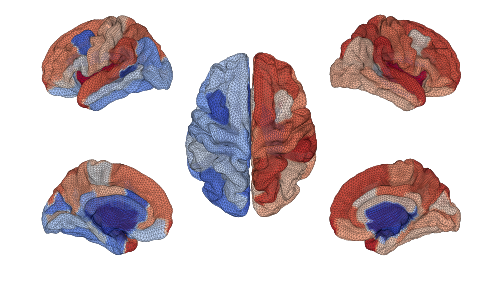

In [17]:
plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=hemi,#rm=rm_l2k8_lhrh,
                   reorient='fs',data=rm_l2k8_lhrh);

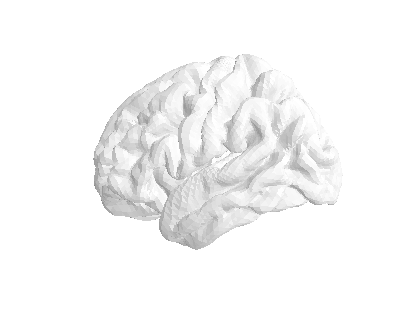

In [13]:
fig = plot_surf([vtx_l2k8_lhrh, tri_l2k8_lhrh], hemisphere='left', view='lateral');

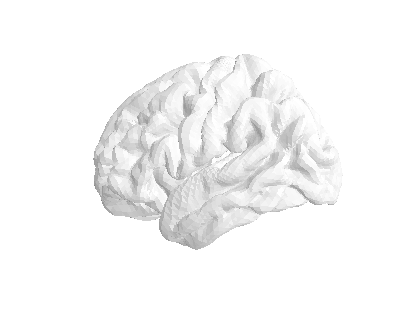

In [18]:
fig = plot_surf([vtx_l2k8_lhrh, tri_l2k8_lhrh], hemisphere='right', view='lateral');

Define some functions

In [3]:
def get_psweep_dfs(ps_res,mul_cols=1.,mul_rows=1.):
    
    # Mean activity
    df = ps_res['all_dat']['e'][0].unstack('t').mean(axis=1).unstack('stim_freq').iloc[::-1,:].copy()
    df.columns = df.columns * mul_cols
    df.index = df.index * mul_rows
    df.columns = ['%1.2f' %f for f in df.columns]
    df.index = ['%1.2f' %f for f in df.index]
    df_mn = df
    
    # Periodogram maximum frequency
    df =  ps_res['all_per_maxfreqs']['e'].unstack('stim_freq').iloc[::-1,:].copy()
    df.columns = df.columns * mul_cols
    df.index = df.index * mul_rows
    df.columns = ['%1.2f' %f for f in df.columns]
    df.index = ['%1.2f' %f for f in df.index]
    df_pmf = df

    # Periodogram maximum amplitude
    df = ps_res['all_per_maxamps']['e'].unstack('stim_freq').iloc[::-1,:].copy()
    df.columns = df.columns * mul_cols
    df.index = df.index * mul_rows
    df.columns = ['%1.2f' %f for f in df.columns]
    df.index = ['%1.2f' %f for f in df.index]
    df_pma =  df

    # Welch maximum frequency
    df = ps_res['all_wel_maxfreqs']['e'].unstack('stim_freq').iloc[::-1,:].copy()
    df.columns = df.columns * mul_cols
    df.index = df.index * mul_rows
    df.columns = ['%1.2f' %f for f in df.columns]
    df.index = ['%1.2f' %f for f in df.index]
    df_wmf = df

    # Welch maximum amplitude
    df = ps_res['all_wel_maxamps']['e'].unstack('stim_freq').iloc[::-1,:].copy()
    df.columns = df.columns * mul_cols
    df.index = df.index * mul_rows
    df.columns = ['%1.2f' %f for f in df.columns]
    df.index = ['%1.2f' %f for f in df.index]
    df_wma = df

    return df_mn,df_pmf,df_pma,df_wmf,df_wma

## Final single-node stim figure

In [4]:
ssX_params = dict(I_o=0.,
             wee = 1.4,wei = 1.4,
                  wie = -2.,wii = -0.5,wertn = 0.6,weth = .6,
            wthi = 0.2,wthe = 1.65,wrtnth = -2.,wthrtn = 2.,D_e = .0001,D_i= .0001,
            D_th = 0.0001,D_rtn = 0.0001,T = 1024,P=1,Q = 1,Dt = 0.001,
            dt = 0.1,gain = 20.,threshold = 0.,Pi = 3.14159,g = -0.9,a_e = 0.3,
            a_i = 0.5,a_th = 0.2,a_rtn = 0.2,i_e = -0.35,i_i = -0.3,i_th = 0.5,
            i_rtn = -0.8,tau1  = 20.,tau2 = 5.,T_transient=1000,
            stim_freq=35.,stim_amp=0.5,
             weights=weights_1N,delays=delays_1N,K=1,
             return_ts=True,compute_connectivity=False,#True,
             stim_type='sinewave',stim_pops=['e'])

In [26]:
ssX_r_params = deepcopy(ssX_params)
ssX_r_params['I_o'] = 0.

ssX_t_params = deepcopy(ssX_params)
ssX_t_params['I_o'] = 1.5


In [33]:
%%time

ssX_lfr_r_res = FreqVsAmpPsweep(ssX_r_params,freqs_s,amps_s,n_jobs=8,concat_res=True,return_ts=True) 
ssX_lfr_r_dfs = get_psweep_dfs(ssX_lfr_r_res)

ssX_lfr_t_res = FreqVsAmpPsweep(ssX_t_params,freqs_s,amps_s,n_jobs=8,concat_res=True,return_ts=True) 
ssX_lfr_t_dfs = get_psweep_dfs(ssX_lfr_t_res)

started: 2018-09-25 14:45:38.538389
finished: 2018-09-25 14:46:44.450665
duration: 0:01:05.912276
started: 2018-09-25 14:46:44.888118
finished: 2018-09-25 14:47:50.026111
duration: 0:01:05.137993
CPU times: user 15 s, sys: 1.46 s, total: 16.4 s
Wall time: 2min 11s


In [34]:
%%time
ssX_hfr_r_res = FreqVsAmpPsweep(ssX_r_params,freqs_l,amps_l,n_jobs=8,concat_res=True,return_ts=True) 
ssX_hfr_r_dfs = get_psweep_dfs(ssX_hfr_r_res)

ssX_hfr_t_res = FreqVsAmpPsweep(ssX_t_params,freqs_l,amps_l,n_jobs=8,concat_res=True,return_ts=True) 
ssX_hfr_t_dfs = get_psweep_dfs(ssX_hfr_t_res)

started: 2018-09-25 14:47:50.402870
finished: 2018-09-25 14:55:17.255108
duration: 0:07:26.852238
started: 2018-09-25 14:55:19.407921
finished: 2018-09-25 15:03:30.162994
duration: 0:08:10.755073
CPU times: user 1min 8s, sys: 6 s, total: 1min 14s
Wall time: 15min 41s


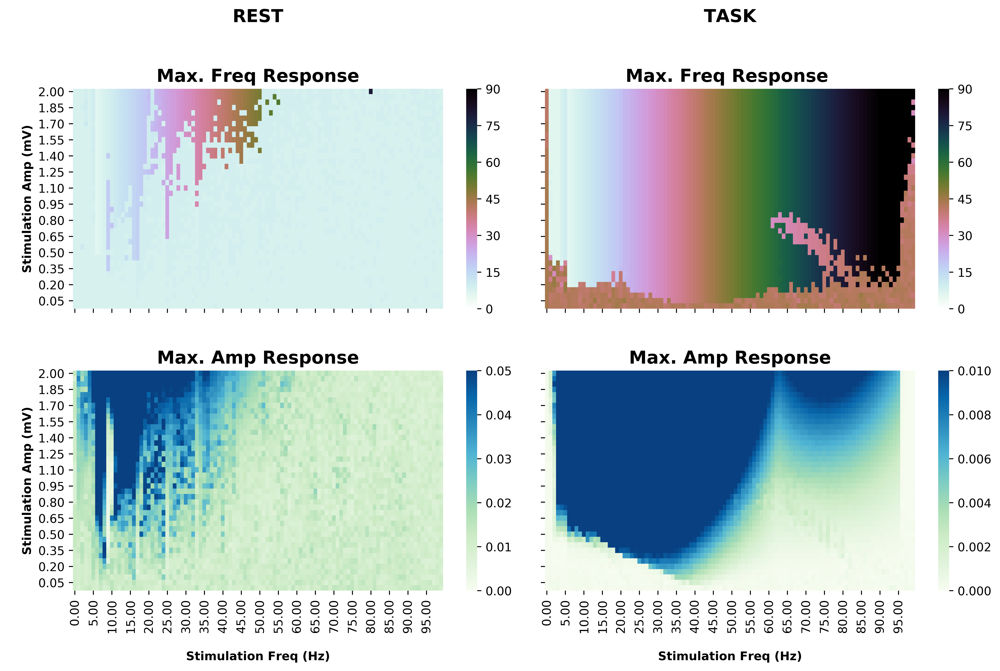

In [109]:
df_mn_r,df_pmf_r,df_pma_r,df_wmf_r,df_wma_r =  ssX_hfr_r_dfs # ps2_dfs_2['1N_r_spiketrain_hfr']
df_mn_t,df_pmf_t,df_pma_t,df_wmf_t,df_wma_t = ssX_hfr_t_dfs

fig, ax = plt.subplots(ncols=2,nrows=2, figsize=(12,8))


"""
1. Maximum frequency responses
"""
a = ax[0][0]
sns.heatmap(df_pmf_r,ax=a,cmap=cm.cubehelix_r,vmin=0,vmax=90)#,vmin=0.,vmax=100.)#,vmax=100.)
a.set_title('REST\n\n\nMax. Freq Response', fontweight='bold', fontsize=15)
a.set_ylabel('\nStimulation Amp (mV)',fontweight='bold')
a.set_xticklabels('')
 
a= ax[0][1]
sns.heatmap(df_pmf_t,ax=a,cmap=cm.cubehelix_r,vmin=0,vmax=90)#,vmin=0.,vmax=100.)#,vmax=100.)
a.set_title('TASK\n\n\nMax. Freq Response ', fontweight='bold', fontsize=15)
a.set_xticklabels('')
a.set_yticklabels('')



"""
2. Maximum amplitude responses
"""

a= ax[1][0]
sns.heatmap(df_pma_r,ax=a,cmap=cm.GnBu,vmin=0,vmax=0.05)#cividis)#,vmin=0.,vmax=0.02)#$,vmax=0.1)
a.set_title('\nMax. Amp Response', fontweight='bold', fontsize=15)
a.set_xlabel('\nStimulation Freq (Hz)', fontweight='bold')
a.set_ylabel('\nStimulation Amp (mV)',fontweight='bold')

a= ax[1][1]
sns.heatmap(df_pma_t,ax=a,cmap=cm.GnBu,vmin=0,vmax=0.01)#gist_rainbow)#,vmin=0.,vmax=0.02)#,vmax=0.02)#,vmax=0.1)
a.set_title('\nMax. Amp Response', fontweight='bold', fontsize=15)
a.set_xlabel('\nStimulation Freq (Hz)', fontweight='bold')
a.set_yticklabels('')


plt.tight_layout()


plt.savefig('FigX.png', bbox_inches='tight', transparent=True,dpi=600)
plt.close()


Image('FigX.png')

## Final regional Io modulation figures

In [21]:
ssX_params = dict(I_o=0.,
             wee = 1.4,wei = 1.4,
                  wie = -2.,wii = -0.5,wertn = 0.6,weth = .6,
            wthi = 0.2,wthe = 1.65,wrtnth = -2.,wthrtn = 2.,D_e = .0001,D_i= .0001,
            D_th = 0.0001,D_rtn = 0.0001,T = 1024,P=1,Q = 1,Dt = 0.001,
            dt = 0.1,gain = 20.,threshold = 0.,Pi = 3.14159,g = -0.9,a_e = 0.3,
            a_i = 0.5,a_th = 0.2,a_rtn = 0.2,i_e = -0.35,i_i = -0.3,i_th = 0.5,
            i_rtn = -0.8,tau1  = 20.,tau2 = 5.,T_transient=1000,
            stim_freq=35.,stim_amp=0.5,
             weights=weights_1N,delays=delays_1N,K=1,
             return_ts=True,compute_connectivity=False,#True,
             stim_type='sinewave',stim_pops=['e'])

### Run sims for focal stimulation

In [30]:
%%time


all_sims = {}

I_o_bg = 0.
I_o_focal = 2.0 #  1.4

for fn,fnn in zip(focal_nodes,focal_node_names)[:1]:

    I_o_vec = np.ones(n_nodes_l2k8) * I_o_bg
    I_o_vec[fn] = I_o_focal
    
    newparams = deepcopy(ssX_params)
    newparams['stim_nodes'] = focal_nodes
    newparams['I_o'] = I_o_vec
    newparams['weights'] = weights_l2k8
    newparams['delays'] = delays_l2k8
    newparams['K'] = n_nodes_l2k8
    newparams['g'] = 0.9
    
    all_sims[fnn] = run_net_sim(**newparams)  
    
    
newparams = deepcopy(ssX_params)
newparams['weights'] = weights_l2k8
newparams['delays'] = delays_l2k8
newparams['K'] = n_nodes_l2k8
newparams['g'] = 0.9

newparams['I_o'] = 0.

ref_sim = run_net_sim(**newparams)  



newparams = deepcopy(ssX_params)
newparams['weights'] = weights_l2k8
newparams['delays'] = delays_l2k8
newparams['K'] = n_nodes_l2k8
newparams['g'] = 0.9

newparams['I_o'] = 0.

ref_sim_2 = run_net_sim(**newparams)  


gammafreq = 35.15625
gammapow = pd.DataFrame(np.squeeze(all_sims[k][1]['e'].loc[gammafreq].values))[0]
gammapow_onsurf = alphapow[rm_l2k8_lhrh]

alphafreq = 11.71875
alphafreq2 = 7.8125
alphapow = pd.DataFrame(np.squeeze(all_sims[k][1]['e'].loc[alphafreq].values))[0]
alphapow_onsurf = alphapow[rm_l2k8_lhrh]

CPU times: user 1min 50s, sys: 300 ms, total: 1min 51s
Wall time: 1min 51s


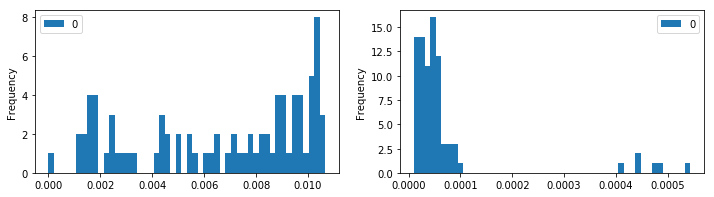

In [44]:
fig, ax = plt.subplots(ncols=2, figsize=(12,3))

pd.DataFrame(alphapow).plot(kind='hist',bins=50,ax=ax[0])
pd.DataFrame(gammapow).plot(kind='hist',bins=50,ax=ax[1])

In [41]:
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 0.002,'vmin': 0.0, 'alpha': None, 'linewidth': 0.05}

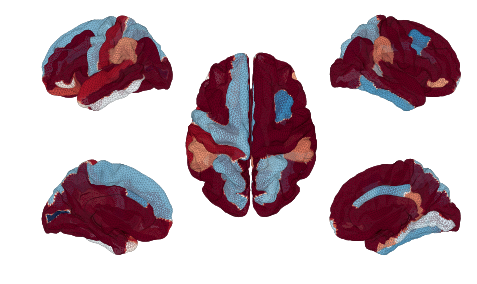

In [45]:
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 0.006,'vmin': 0.0, 'alpha': None, 'linewidth': 0.05}

plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=hemi,reorient='fs',data=gammapow_onsurf,
                    shade_kwargs=kws)                    

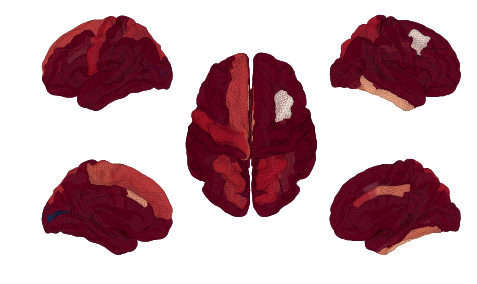

In [42]:
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 0.002,'vmin': 0.0, 'alpha': None, 'linewidth': 0.05}

plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=hemi,reorient='fs',data=alphapow_onsurf,
                    shade_kwargs=kws)                    

 ### Plot focal changes on brains

Alpha suppression

In [46]:
alphafreq = 11.71875
alphafreq2 = 7.8125

alphafreq = alphafreq2

    
#fIo_alpha = pd.DataFrame(np.squeeze(all_sims['lV1'][1]['e'].loc[alphafreq].values),index=conn96_cortical.region_labels)[0]
fIo_alpha = pd.DataFrame(np.squeeze(all_sims['lV1'][1]['e'].loc[alphafreq].values))[0]
#ref_alpha = pd.DataFrame(np.squeeze(ref_sim[1]['e'].loc[alphafreq].values),index=conn96_cortical.region_labels)[0]
ref_alpha = pd.DataFrame(np.squeeze(ref_sim[1]['e'].loc[alphafreq].values))[0]
ref_sub_fIo_alpha = ref_alpha - fIo_alpha


gammafreq = 35.15625
            
#fIo_gamma = pd.DataFrame(np.squeeze(all_sims['lV1'][1]['e'].loc[gammafreq].values),index=conn96_cortical.region_labels)[0]
fIo_gamma = pd.DataFrame(np.squeeze(all_sims['lV1'][1]['e'].loc[gammafreq].values))[0]
#ref_gamma = pd.DataFrame(np.squeeze(ref_sim[1]['e'].loc[gammafreq].values),index=conn96_cortical.region_labels)[0]
ref_gamma = pd.DataFrame(np.squeeze(ref_sim[1]['e'].loc[gammafreq].values))[0]
ref_sub_fIo_gamma = ref_gamma - fIo_gamma



                         

fIo_ts = all_sims['lV1'][0]['e'].copy()
#fIo_ts.columns = conn96_cortical.region_labels
#fIo_ts.columns = conn96_cortical.region_labels
#fIo_ts_z = pd.DataFrame(zscore(fIo_ts,axis=0),columns=fIo_ts.columns,index=fIo_ts.index)
fIo_ts_z = pd.DataFrame(zscore(fIo_ts,axis=0),columns=fIo_ts.columns,index=fIo_ts.index)

ref_ts = ref_sim[0]['e'].copy()
#ref_ts.columns = conn96_cortical.region_labels
#ref_ts_z = pd.DataFrame(zscore(ref_ts,axis=0),columns=ref_ts.columns,index=ref_ts.index)
ref_ts_z = pd.DataFrame(zscore(ref_ts,axis=0),columns=ref_ts.columns,index=ref_ts.index)

fIo_ps = all_sims['lV1'][1]['e'].loc[:100].copy()
#fIo_ps.columns = conn96_cortical.region_labels

ref_ps = ref_sim[1]['e'].loc[:100].copy()
#ref_ps.columns = conn96_cortical.region_labels


fIo_ps_alpha = fIo_ps.loc[alphafreq]
fIo_ps_gamma = fIo_ps.loc[gammafreq]

ref_ps_alpha = ref_ps.loc[alphafreq]
ref_ps_gamma = ref_ps.loc[gammafreq]


# norm by nodes

fIo_ps_nbn = fIo_ps / fIo_ps.abs().mean(axis=0)
ref_ps_nbn = ref_ps / ref_ps.abs().mean(axis=0)

fIo_ps_nbn_alpha = fIo_ps_nbn.loc[alphafreq]
fIo_ps_nbn_gamma = fIo_ps_nbn.loc[gammafreq]

ref_ps_nbn_alpha = ref_ps_nbn.loc[alphafreq]
ref_ps_nbn_gamma = ref_ps_nbn.loc[gammafreq]



# norm by freqs

fIo_ps_nbf = (fIo_ps.T - fIo_ps.T.abs().mean(axis=0)).T
ref_ps_nbf = (ref_ps.T - ref_ps.T.abs().mean(axis=0)).T

fIo_ps_nbf_alpha = fIo_ps_nbf.loc[alphafreq]
fIo_ps_nbf_gamma = fIo_ps_nbf.loc[gammafreq]

ref_ps_nbf_alpha = ref_ps_nbf.loc[alphafreq]
ref_ps_nbf_gamma = ref_ps_nbf.loc[gammafreq]



# ref sub fIo

ref_sub_fIo_ps = ref_ps - fIo_ps
ref_sub_fIo_ps_nbn = ref_ps_nbn - fIo_ps_nbn
ref_sub_fIo_ps_nbf = ref_ps_nbf - fIo_ps_nbf

ref_sub_fIo_ps_alpha = ref_sub_fIo_ps.loc[alphafreq]
ref_sub_fIo_ps_gamma = ref_sub_fIo_ps.loc[gammafreq]

ref_sub_fIo_ps_nbn_alpha = ref_sub_fIo_ps_nbn.loc[alphafreq]
ref_sub_fIo_ps_nbn_gamma = ref_sub_fIo_ps_nbn.loc[gammafreq]

ref_sub_fIo_ps_nbf_alpha = ref_sub_fIo_ps_nbf.loc[alphafreq]
ref_sub_fIo_ps_nbf_gamma = ref_sub_fIo_ps_nbf.loc[gammafreq]



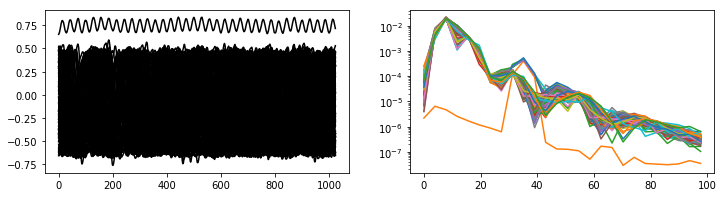

In [91]:
fig, ax  = plt.subplots(ncols=2,figsize=(12,3))

fIo_ts.plot(legend=False, c='k',ax=ax[0])

fIo_ps.loc[:100].plot(legend=False,logy=True,ax=ax[1])

In [49]:
#iscortical = conn96_cortical.cortical

### Final figure

In [59]:
dat = -ref_sub_fIo_ps_nbn_alpha.values

dat_onsurf = dat[rm_l2k8_lhrh]

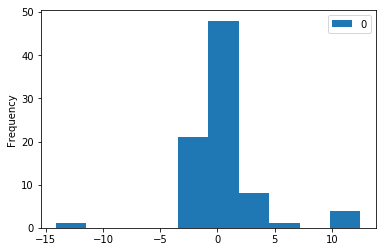

In [55]:
pd.DataFrame(dat).plot(kind='hist')

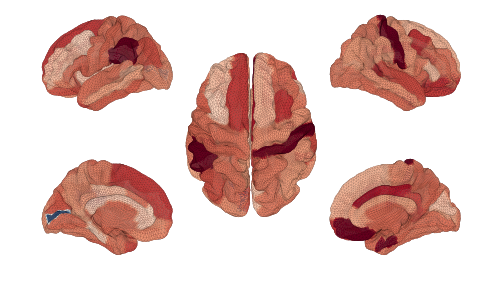

In [62]:
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 5,'vmin': -15, 'alpha': None, 'linewidth': 0.05}

plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=hemi,reorient='fs',data=dat_onsurf,
                    shade_kwargs=kws)                    

WARNING  /hecuba/mcintosh_lab/john/VM_Software/miniconda2/envs/jupyter/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



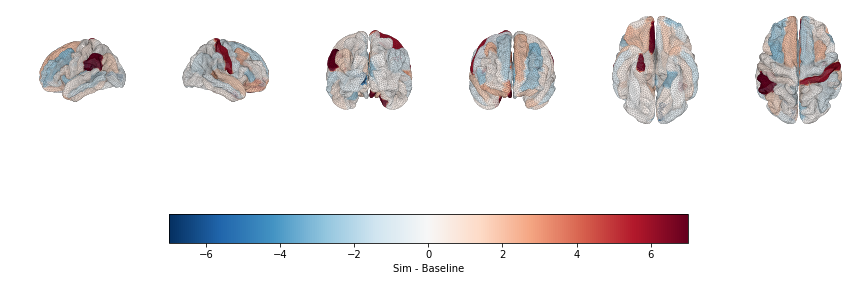

In [64]:
dat = -ref_sub_fIo_ps_nbn_alpha
dat_onsurf = dat[rm_l2k8_lhrh]


_cm = 'RdBu_r'

kws = {'edgecolors': 'k', 'vmin': -7., 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 7., 'alpha': None, 'linewidth': 0.05}
 
fig, ax  =plt.subplots(ncols=6, figsize=(12,4))

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='lh_lat',reorient='fs',ax=ax[0])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax[1])

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='anterior',reorient='fs',ax=ax[2])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='posterior',reorient='fs',ax=ax[3])

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='inferior',reorient='fs',ax=ax[4])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='superior',reorient='fs',ax=ax[5])

ax1 = fig.add_axes([0.2, -0.1, 0.6, 0.1])
norm = mpl.colors.Normalize(vmin=kws['vmin'], vmax=kws['vmax'])
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=kws['cmap'],norm=norm,orientation='horizontal')
cb1.set_label('Sim - Baseline')

plt.tight_layout()

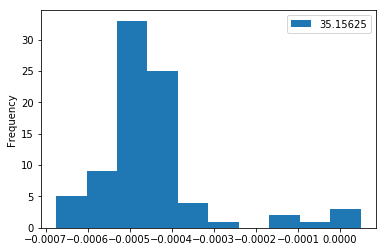

In [67]:
pd.DataFrame(dat).plot(kind='hist')

WARNING  /hecuba/mcintosh_lab/john/VM_Software/miniconda2/envs/jupyter/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



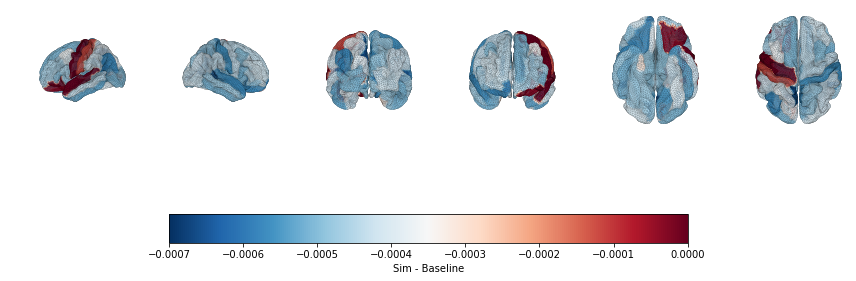

In [68]:

dat = -ref_sub_fIo_ps_gamma
dat_onsurf = dat[rm_l2k8_lhrh]

_cm = 'RdBu_r'

kws = {'edgecolors': 'k', 'vmin': -0.0007, 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 0., 'alpha': None, 'linewidth': 0.05}


fig, ax  =plt.subplots(ncols=6, figsize=(12,4))

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='lh_lat',reorient='fs',ax=ax[0])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax[1])

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='anterior',reorient='fs',ax=ax[2])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='posterior',reorient='fs',ax=ax[3])

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='inferior',reorient='fs',ax=ax[4])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='superior',reorient='fs',ax=ax[5])

ax1 = fig.add_axes([0.2, -0.1, 0.6, 0.1])
norm = mpl.colors.Normalize(vmin=kws['vmin'], vmax=kws['vmax'])
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=kws['cmap'],norm=norm,orientation='horizontal')
cb1.set_label('Sim - Baseline')

plt.tight_layout()

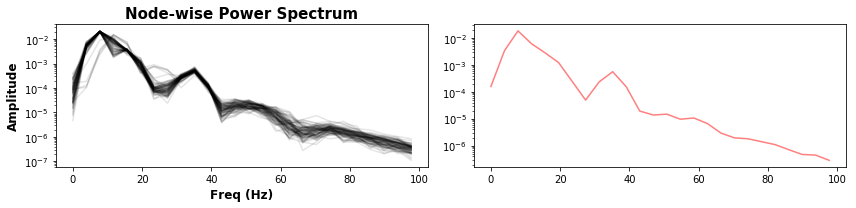

In [92]:


idx = 21


fig, ax = plt.subplots(ncols=2, figsize=(12,3))

ref_ps.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax[0])
ref_ps[idx].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax[1])

ax[0].set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax[0].set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax[0].set_title('Node-wise Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))


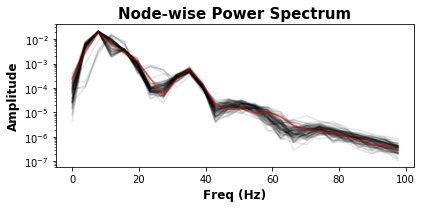

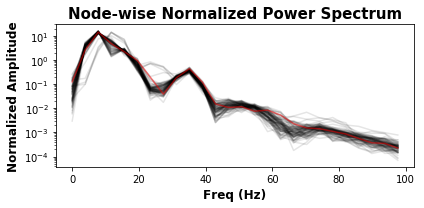

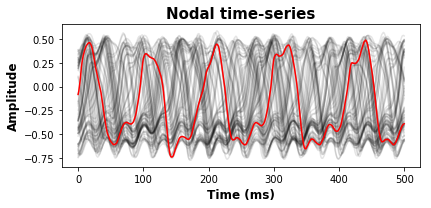

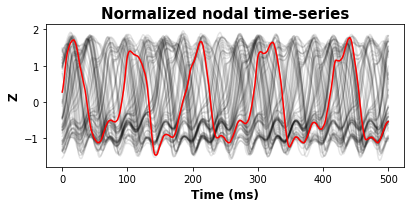

In [80]:


idx = 21

f = 'ref_ps__power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

ref_ps.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
ref_ps[idx].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))


# ---


f = 'ref_ps_nbn__normalized_power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

ref_ps_nbn.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
ref_ps_nbn[idx].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Normalized Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Normalized Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))






# ---


f = 'ref_ts.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

ref_ts.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
ref_ts.loc[:500][idx].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))


# ---


f = 'ref_ts_z.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

ref_ts_z.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
ref_ts_z.loc[:500][idx].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Z',fontweight='bold',fontsize=12)
ax.set_title('Normalized nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))


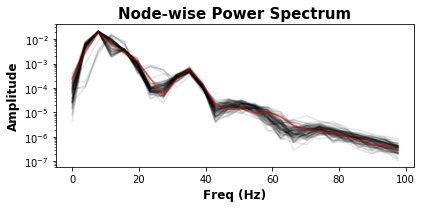

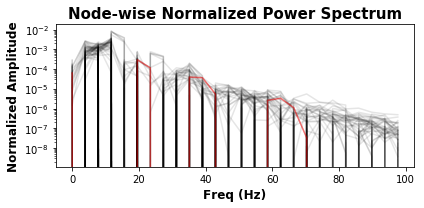

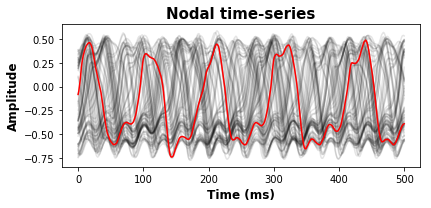

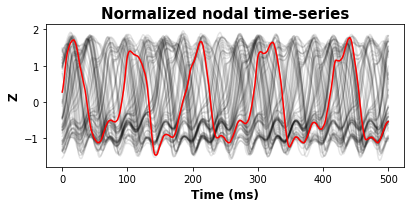

In [94]:


idx = 21

f = 'ref_ps__power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

ref_ps.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
ref_ps[idx].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))


# ---


f = 'ref_ps_nbn__normalized_power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

ref_ps_nbf.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
ref_ps_nbf[idx].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Normalized Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Normalized Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))






# ---


f = 'ref_ts.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

ref_ts.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
ref_ts.loc[:500][idx].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))


# ---


f = 'ref_ts_z.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

ref_ts_z.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
ref_ts_z.loc[:500][idx].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Z',fontweight='bold',fontsize=12)
ax.set_title('Normalized nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))


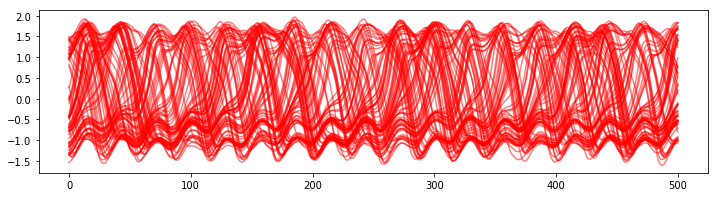

In [84]:
ref_ts_z.loc[:500].plot(legend=False,c='r',figsize=(12,3),alpha=0.5)

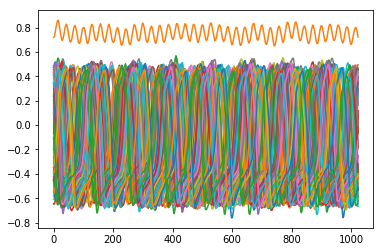

In [140]:
all_sims['lV1'][0]['e'].plot(legend=False)

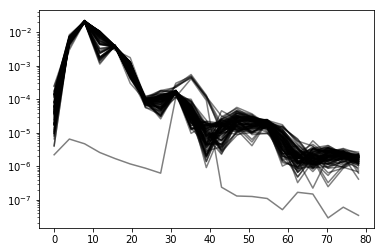

In [93]:
all_sims['lV1'][1]['e'].loc[:80].plot(logy=True,legend=False,c='k', alpha=0.5)


In [154]:
all_sims['lV1'][1]['e'].loc[7:13].mean().shape

(83,)

In [157]:
dat = all_sims['lV1'][1]['e'].loc[7:13].mean().values[rm_l2k8]

In [159]:
dat

array([0.0146179 , 0.01165832, 0.01432307, ..., 0.01556172, 0.01556172,
       0.01556172])

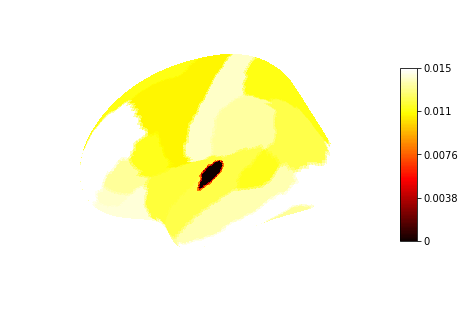

In [161]:
fig = plot_surf_stat_map([vtx_l2k8,tri_l2k8],dat[rm_l2k8])#,cmap=_cm);
#,shade_kwargs=kws,view='lh_lat',reorient='fs')

In [147]:
rm_l2k8

array([24, 29, 28, ..., 16, 16, 16])

Normalized across nodes

In [130]:
vtx_l2k8 = lhi_vtx
tri_l2k8 = lhi_tri
rm_l2k8 = lh_annot[0]

In [131]:
from nilearn.plotting import plot_surf_stat_map

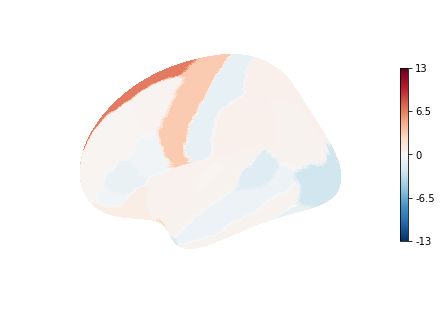

In [132]:
fig = plot_surf_stat_map([vtx_l2k8,tri_l2k8],dat.values[rm_l2k8],cmap=_cm);#,shade_kwargs=kws,view='lh_lat',reorient='fs')

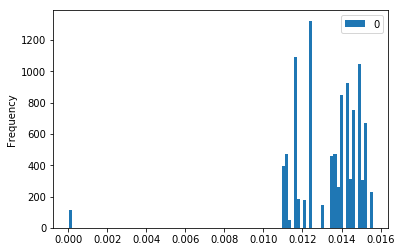

In [166]:
pd.DataFrame(dat).plot(kind='hist', bins=100)

In [164]:
kws

{'alpha': None,
 'cmap': 'RdBu_r',
 'edgecolors': 'k',
 'linewidth': 0.05,
 'vmax': 7.0,
 'vmin': -7.0}

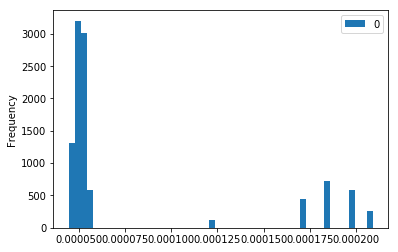

In [172]:
pd.DataFrame(dat).plot(kind='hist', bins=50)

In [178]:
0.00001

1e-05

In [174]:
1E-6

1e-05

In [173]:
1E-6,1E-5


5e-05

In [181]:
rm_l2k8.max()

35

In [ ]:
rm

In [191]:
from matplotlib import pyplot as plt
from matplotlib.pyplot import subplot

In [210]:
rm_l2k8_rh_p1 = rm_l2k8_rh + 36
rm_l2k8_rh_p1[rm_l2k8_rh == 0] = 0

rm_l2k8_lhrh = np.concatenate([rm_l2k8_lh, rm_l2k8_rh_p1], axis=0)
rm_l2k8_lhrh

array([24, 29, 28, ..., 45, 45, 45])

In [216]:
rm_l2k8_lhrh.shape

(20484,)

In [221]:
lhi_vtx.shape

(10242, 3)

In [220]:
np.unique(rm_l2k8_lhrh)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71])

In [218]:
l2k8_lA1_idx.vertices

AttributeError: 'int' object has no attribute 'vertices'

In [226]:
vtx_l2k8_lhrh.shape

(20484, 3)

In [228]:
tri_l2k8_lhrh.max()

20483

In [232]:
plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh)#,rm=rm_l2k8_lhrh,data=dat);

TypeError: 'NoneType' object has no attribute '__getitem__'

In [233]:
%debug

> /rri_disks/hecuba/mcintosh_lab/john/VM_Code/libraries_of_mine/github/BroadcastingPatternedStimulationAcrossTheConnectome/bsac/GL_model.py(1198)plot_surface_mpl_mv()
   1196 
   1197   if vtx is not None:                                    # Option 1
-> 1198     tri_hemi = hemi[tri].any(axis=1)
   1199     tri_lh,tri_rh = tri[tri_hemi==0],tri[tri_hemi==1]
   1200   elif vtx_lh is not None:                               # Option 2

ipdb> tri_hemi
*** NameError: name 'tri_hemi' is not defined
ipdb> tri
array([[    0,  2564,  2562],
       [    0,  2562,  2565],
       [    0,  2565,  2567],
       ...,
       [20483, 20160, 12696],
       [20403, 20160, 20483],
       [20403, 10253, 20160]], dtype=int32)
ipdb> hemi
ipdb> tri_hemi
*** NameError: name 'tri_hemi' is not defined
ipdb> c


In [235]:
rm_l2k8_lhrh = np.ones_like(vtx_l2k8_lh[:,0])

In [19]:
_dat = np.ones_like(rm_l2k8_lhrh)
_dat[:10242] = 0
_dat

plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=_dat)#,rm=rm_l2k8_lhrh)#,data=dat);

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
tri_l2k8_lhrh[vt]

In [247]:
vtx_l2k8_lhrh.shape

(20484, 3)

In [245]:
vtx_l2k8_lhrh[:,tri_l2k8_rh]

IndexError: index 2564 is out of bounds for axis 1 with size 3

In [253]:
vtx_l2k8_rh.shape

(10242, 3)

In [255]:
tmp = tri_l2k8_rh.copy()
#tmp+=10242
#tmp[tri_l2k8_rh==0] = 0

vtx_l2k8_lhrh = np.concatenate([vtx_l2k8_lh,vtx_l2k8_rh], axis=0)
tri_l2k8_lhrh = np.concatenate([tri_l2k8_lh,tri_l2k8_rh+10242],axis=0)

fig = plot_surf([vtx_l2k8_lhrh, tri_l2k8_lhrh], hemisphere='left', view='lateral');

fig = plot_surf([vtx_l2k8_lhrh, tri_l2k8_lhrh], hemisphere='right', view='lateral');

from nilearn.plotting import plot_surf

In [249]:
tri_l2k8_rh

array([[    0,  2564,  2562],
       [    0,  2562,  2565],
       [    0,  2565,  2567],
       ...,
       [10241,  9918,  2454],
       [10161,  9918, 10241],
       [10161,    11,  9918]], dtype=int32)

In [239]:
rm_l2k8_lhrh = np.concatenate([rm_l2k8_lh,rm_l2k8_rh_p1], axis=0)

dat = all_sims['lV1'][1]['e'].loc[7:13].mean().values[rm_l2k8_lhrh]

plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,rm=rm_l2k8_lhrh,data=dat);

TypeError: 'NoneType' object has no attribute '__getitem__'

In [ ]:
_cm = 'hot' # RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 0.02,'vmin': 0.01, 'alpha': None, 'linewidth': 0.05}

dat = all_sims['lV1'][1]['e'].loc[7:13].mean().values[rm_l2k8]


In [ ]:
_dat = np.ones_like(rm_l2k8_lhrh)
_dat[:10242] = 0
_dat




plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=_dat,#rm=rm_l2k8_lhrh,
                   reorient='fs',data=rm_l2k8_lhrh);

In [ ]:
hemi = np.ones_like(rm_l2k8_lhrh)
hemi[:10242] = 0
hemi

plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=hemi,#rm=rm_l2k8_lhrh,
                   reorient='fs',data=rm_l2k8_lhrh);

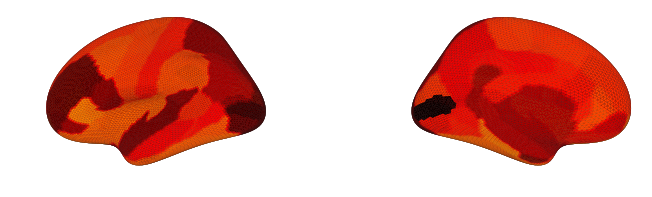

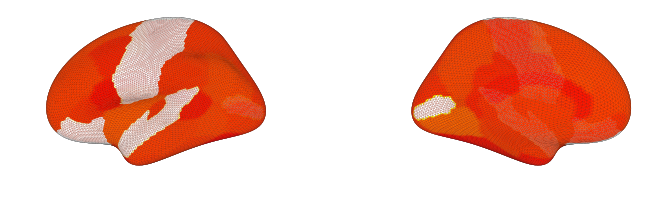

In [179]:
_cm = 'hot' # RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 0.02,'vmin': 0.01, 'alpha': None, 'linewidth': 0.05}

dat = all_sims['lV1'][1]['e'].loc[7:13].mean().values[rm_l2k8]

fig, ax = plt.subplots(ncols=2, figsize=(12,3))

plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,
                 rm=rm_l2k8,data=dat,
                 shade_kwargs=kws,view='lh_lat',reorient='fs',ax=ax[0])

plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,
                 rm=rm_l2k8,data=dat,
                 shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax[1])


_cm = 'hot' # RdBu_r'
kws = {'edgecolors': 'k', 'vmin': 1E-5, 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 1E-4, 'alpha': None, 'linewidth': 0.05}

dat = all_sims['lV1'][1]['e'].loc[30:50].mean().values[rm_l2k8]

fig, ax = plt.subplots(ncols=2, figsize=(12,3))

plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,
                 rm=rm_l2k8,data=dat,
                 shade_kwargs=kws,view='lh_lat',reorient='fs',ax=ax[0])

plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,
                 rm=rm_l2k8,data=dat,
                 shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax[1])


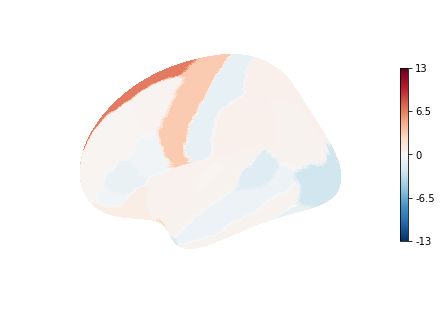

In [79]:
fig = plot_surf_stat_map([vtx_l2k8,tri_l2k8],dat.values[rm_l2k8],cmap=_cm);#,shade_kwargs=kws,view='lh_lat',reorient='fs')

WARNING  /hecuba/mcintosh_lab/john/VM_Software/miniconda2/envs/jupyter/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



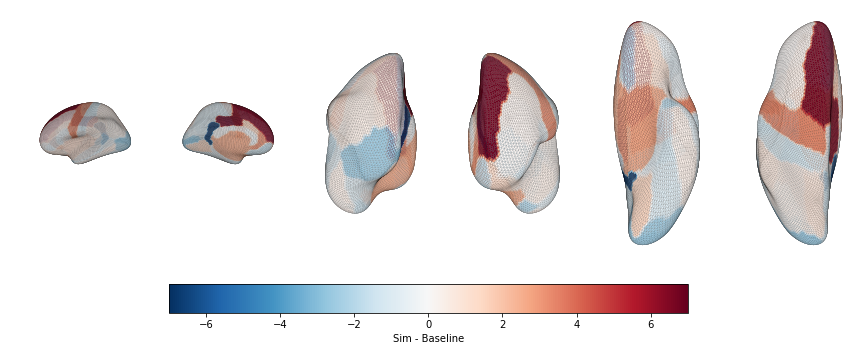

In [67]:
dat = -ref_sub_fIo_ps_nbn_alpha

_cm = 'RdBu_r'

kws = {'edgecolors': 'k', 'vmin': -7., 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 7., 'alpha': None, 'linewidth': 0.05}
 
fig, ax  =plt.subplots(ncols=6, figsize=(12,4))

plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,rm=rm_l2k8,data=dat,shade_kwargs=kws,view='lh_lat',reorient='fs',ax=ax[0])
plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,rm=rm_l2k8,data=dat,shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax[1])

plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,rm=rm_l2k8,data=dat,shade_kwargs=kws,view='anterior',reorient='fs',ax=ax[2])
plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,rm=rm_l2k8,data=dat,shade_kwargs=kws,view='posterior',reorient='fs',ax=ax[3])

plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,rm=rm_l2k8,data=dat,shade_kwargs=kws,view='inferior',reorient='fs',ax=ax[4])
plot_surface_mpl(vtx=vtx_l2k8,tri=tri_l2k8,rm=rm_l2k8,data=dat,shade_kwargs=kws,view='superior',reorient='fs',ax=ax[5])

ax1 = fig.add_axes([0.2, -0.1, 0.6, 0.1])
norm = mpl.colors.Normalize(vmin=kws['vmin'], vmax=kws['vmax'])
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=kws['cmap'],norm=norm,orientation='horizontal')
cb1.set_label('Sim - Baseline')

plt.tight_layout()

WARNING  /hecuba/mcintosh_lab/john/VM_Software/miniconda2/envs/jupyter/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



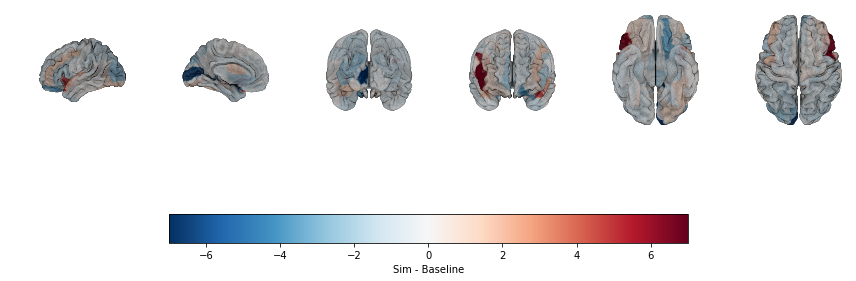

In [23]:
dat = -ref_sub_fIo_ps_nbn_alpha

_cm = 'RdBu_r'

kws = {'edgecolors': 'k', 'vmin': -7., 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 7., 'alpha': None, 'linewidth': 0.05}
 
fig, ax  =plt.subplots(ncols=6, figsize=(12,4))

plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='lh_lat',reorient='fs',ax=ax[0])
plot_surface_mpl(vtx=vtx_96,tri=tri_96[lh_tri_idxs,:],rm=rm_96,data=dat,shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax[1])

plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='anterior',reorient='fs',ax=ax[2])
plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='posterior',reorient='fs',ax=ax[3])

plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='inferior',reorient='fs',ax=ax[4])
plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='superior',reorient='fs',ax=ax[5])

ax1 = fig.add_axes([0.2, -0.1, 0.6, 0.1])
norm = mpl.colors.Normalize(vmin=kws['vmin'], vmax=kws['vmax'])
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=kws['cmap'],norm=norm,orientation='horizontal')
cb1.set_label('Sim - Baseline')

plt.tight_layout()

WARNING  /hecuba/mcintosh_lab/john/VM_Software/miniconda2/envs/jupyter/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



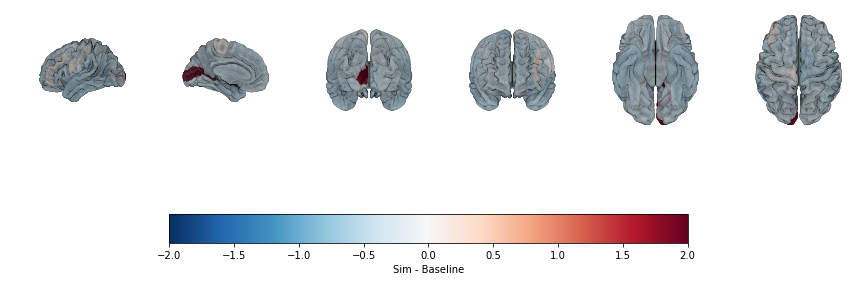

In [24]:
dat = -ref_sub_fIo_ps_nbn_gamma

_cm = 'RdBu_r'

kws = {'edgecolors': 'k', 'vmin': -2., 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 2., 'alpha': None, 'linewidth': 0.05}
 
fig, ax  =plt.subplots(ncols=6, figsize=(12,4))
plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='lh_lat',reorient='fs',ax=ax[0])
plot_surface_mpl(vtx=vtx_96,tri=tri_96[lh_tri_idxs,:],rm=rm_96,data=dat,shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax[1])

plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='anterior',reorient='fs',ax=ax[2])
plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='posterior',reorient='fs',ax=ax[3])

plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='inferior',reorient='fs',ax=ax[4])
plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view='superior',reorient='fs',ax=ax[5])

ax1 = fig.add_axes([0.2, -0.1, 0.6, 0.1])
norm = mpl.colors.Normalize(vmin=kws['vmin'], vmax=kws['vmax'])
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=kws['cmap'],norm=norm,orientation='horizontal')
cb1.set_label('Sim - Baseline')

plt.tight_layout()

In [782]:
def imageCrop(filename):

    from PIL import Image

    i1 = Image.open(filename)
    i2 = np.array(i1)
    i2[i2.sum(axis=2) == 255*4,:] = 0
    i3 = i2.sum(axis=2)
    x = np.where((i3.sum(axis=1) != 0) * 1)[0]
    y = np.where((i3.sum(axis=0) != 0) * 1)[0]

    result = Image.fromarray(i2[x.squeeze()][:,y.squeeze()])
    result.save(filename)    

In [ ]:
dat = -ref_sub_fIo_ps_nbn_alpha

base_fname = 'fIo_sub_ref_ps_nbn_alpha'

views = ['lh_lat', 'anterior', 'posterior', 'inferior', 'superior']

_cm = 'RdBu_r'

kws = {'edgecolors': 'k', 'vmin': -7., 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 7., 'alpha': None, 'linewidth': 0.05}

for v in views:
    
    f = '%s__%s.png' %(base_fname, v)    
    fig, ax  =plt.subplots(figsize=(12,10))
    plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view=v,reorient='fs',ax=ax)
    plt.tight_layout(); 
    plt.savefig(f, bbox_inches='tight', transparent=True, dpi=600); 
    plt.close(); 
    imageCrop(f)
    
v = 'lh_med'
f = '%s__%s.png' %(base_fname, v)    
fig, ax  =plt.subplots(figsize=(12,10))
plot_surface_mpl(vtx=vtx_96,tri=tri_96[lh_tri_idxs,:],rm=rm_96,data=dat,shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax)
plt.tight_layout(); 
plt.savefig(f, bbox_inches='tight', transparent=True, dpi=600); 
plt.close();
imageCrop(f)


f = base_fname + '__colourbar.png'
fig, ax  =plt.subplots(figsize=(5,1.5))#0))
#ax1 = fig.add_axes([0.,0.5,0.3,0.1])#0.3,0.1])#4.,1.])#0.2, -0.1, 0.6, 0.1])
norm = mpl.colors.Normalize(vmin=kws['vmin'], vmax=kws['vmax'])
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=kws['cmap'],norm=norm,orientation='horizontal')
cb1.set_label('Sim - Baseline')
plt.tight_layout(); 
plt.savefig(f, bbox_inches='tight', transparent=True, dpi=600); 
plt.close(); 
imageCrop(f)

In [ ]:
base_fname = 'fIo_sub_ref_ps_nbn_alpha'

display(Image(base_fname + '__lh_lat.png',width=150),
        Image(base_fname + '__lh_med.png',width=150),
        Image(base_fname + '__anterior.png',width=150),
        Image(base_fname + '__posterior.png',width=150),
        Image(base_fname + '__inferior.png',width=150),
        Image(base_fname + '__superior.png',width=150),
        Image(base_fname + '__colourbar.png',width=150))

In [844]:
dat = -ref_sub_fIo_ps_nbn_gamma

base_fname = 'fIo_sub_ref_ps_nbn_gamma'

views = ['lh_lat', 'anterior', 'posterior', 'inferior', 'superior']

_cm = 'RdBu_r'

kws = {'edgecolors': 'k', 'vmin': -2., 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 2., 'alpha': None, 'linewidth': 0.05}

for v in views:
    
    f = '%s__%s.png' %(base_fname, v)    
    fig, ax  =plt.subplots(figsize=(12,10))
    plot_surface_mpl(vtx=vtx_96,tri=tri_96,rm=rm_96,data=dat,shade_kwargs=kws,view=v,reorient='fs',ax=ax)
    plt.tight_layout(); 
    plt.savefig(f, bbox_inches='tight', transparent=True, dpi=600); 
    plt.close(); 
    imageCrop(f)
    
v = 'lh_med'
f = '%s__%s.png' %(base_fname, v)    
fig, ax  =plt.subplots(figsize=(12,10))
plot_surface_mpl(vtx=vtx_96,tri=tri_96[lh_tri_idxs,:],rm=rm_96,data=dat,shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax)
plt.tight_layout(); 
plt.savefig(f, bbox_inches='tight', transparent=True, dpi=600); 
plt.close();
imageCrop(f)


f = base_fname + '__colourbar.png'
fig, ax  =plt.subplots(figsize=(5,1.5))#0))
#ax1 = fig.add_axes([0.,0.5,0.3,0.1])#0.3,0.1])#4.,1.])#0.2, -0.1, 0.6, 0.1])
norm = mpl.colors.Normalize(vmin=kws['vmin'], vmax=kws['vmax'])
cb1 = mpl.colorbar.ColorbarBase(ax, cmap=kws['cmap'],norm=norm,orientation='horizontal')
cb1.set_label('Sim - Baseline')
plt.tight_layout(); 
plt.savefig(f, bbox_inches='tight', transparent=True, dpi=600); 
plt.close(); 
imageCrop(f)

In [ ]:
base_fname = 'fIo_sub_ref_ps_nbn_gamma'

display(Image(base_fname + '__lh_lat.png',width=150),
        Image(base_fname + '__lh_med.png',width=150),
        Image(base_fname + '__anterior.png',width=150),
        Image(base_fname + '__posterior.png',width=150),
        Image(base_fname + '__inferior.png',width=150),
        Image(base_fname + '__superior.png',width=150),
        Image(base_fname + '__colourbar.png',width=150))

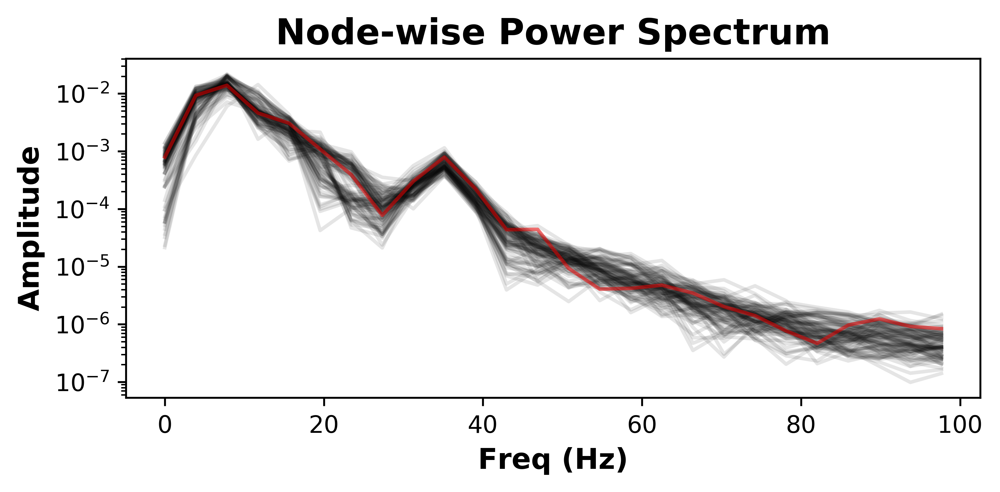

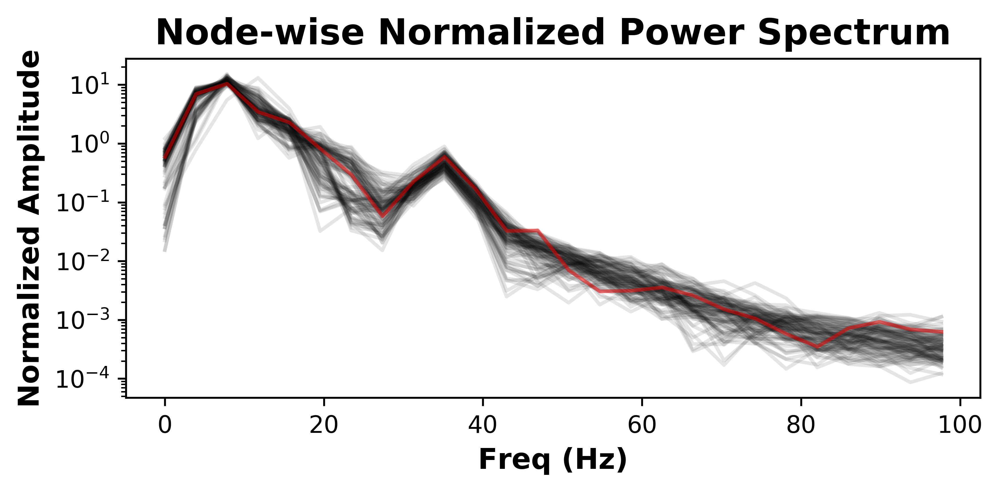

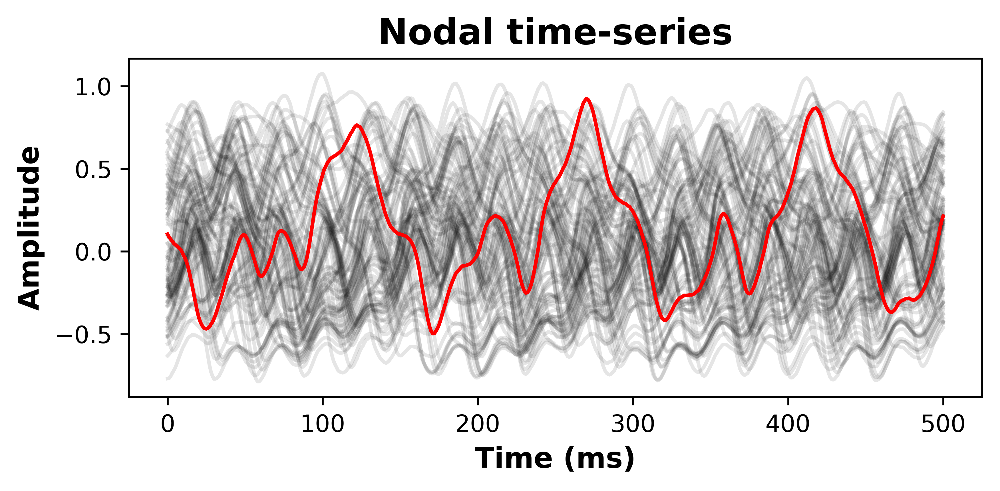

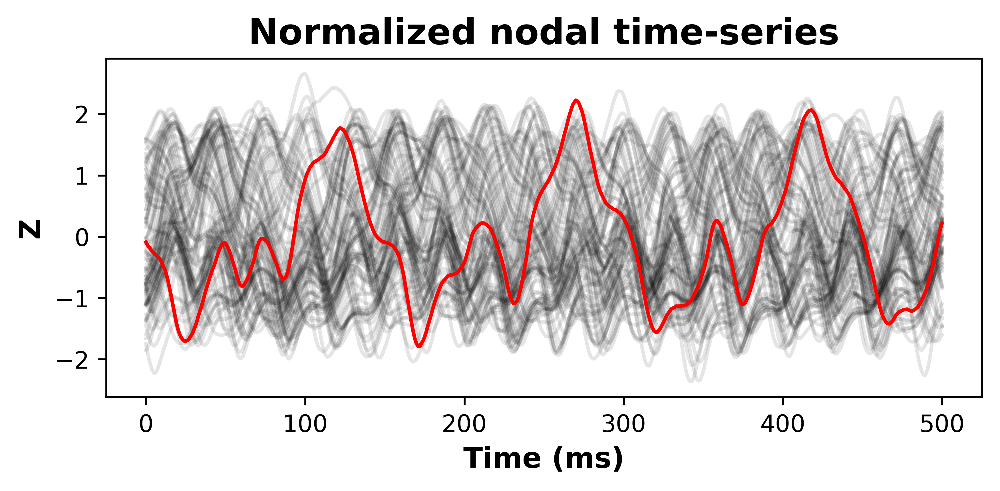

In [984]:
f = 'ref_ps__power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

ref_ps.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
ref_ps['RM-V1_L'].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
plt.close()

display(Image(f,width=500))


# ---


f = 'ref_ps_nbn__normalized_power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

ref_ps_nbn.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
ref_ps_nbn['RM-V1_L'].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Normalized Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Normalized Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
plt.close()

display(Image(f,width=500))






# ---


f = 'ref_ts.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

ref_ts.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
ref_ts.loc[:500]['RM-V1_L'].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
plt.close()

display(Image(f,width=500))


# ---


f = 'ref_ts_z.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

ref_ts_z.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
ref_ts_z.loc[:500]['RM-V1_L'].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Z',fontweight='bold',fontsize=12)
ax.set_title('Normalized nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
plt.close()

display(Image(f,width=500))


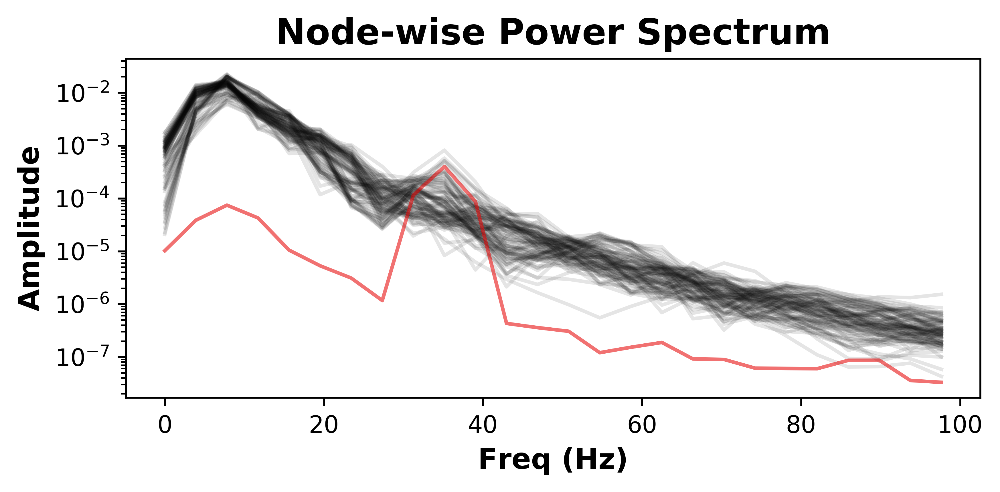

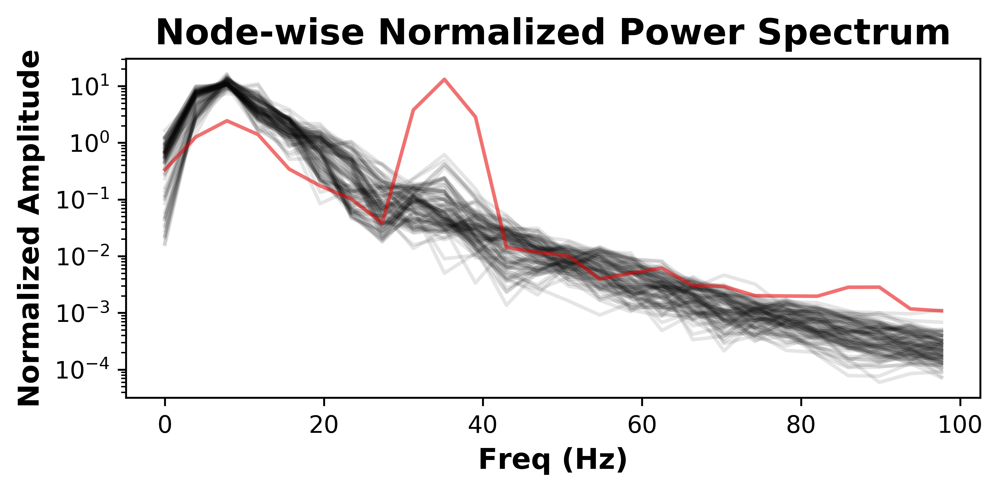

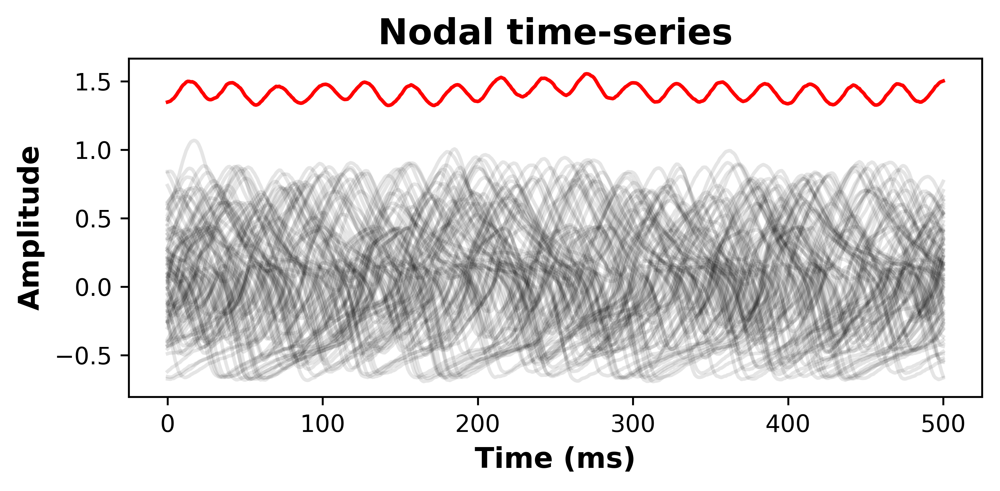

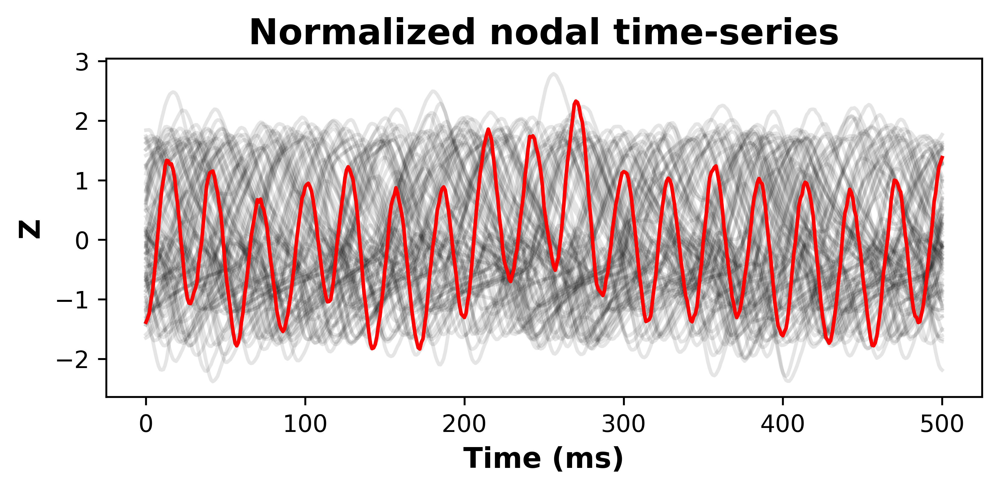

In [983]:
f = 'fIo_ps__power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

fIo_ps.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
fIo_ps['RM-V1_L'].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
plt.close()

display(Image(f,width=500))


# ---


f = 'fIo_ps_nbn__normalized_power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

fIo_ps_nbn.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
fIo_ps_nbn['RM-V1_L'].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Normalized Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Normalized Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
plt.close()

display(Image(f,width=500))



# ---


f = 'fIo_ts.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

fIo_ts.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
fIo_ts.loc[:500]['RM-V1_L'].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
plt.close()

display(Image(f,width=500))


# ---


f = 'fIo_ts_z.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

fIo_ts_z.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
fIo_ts_z.loc[:500]['RM-V1_L'].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Z',fontweight='bold',fontsize=12)
ax.set_title('Normalized nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
plt.close()

display(Image(f,width=500))


---

In [4]:
cv = 4.0

In [5]:
f = '/mnt/rotmangrid-scratch/mcintosh_lab/jgriffiths/Data/tshsothc_data/data/all_hcp_dwi_data.h5'
F = h5py.File(f, 'r')
F.close()

#df_weights = pd.DataFrame(weights)
#df_delays = pd.DataFrame(delays)

df_l2k8_w = pd.read_hdf(f, 'avg_weight_sc33_N711')
df_l2k8_w *= ((np.eye(83)*-1) + 1)
df_l2k8_wlog = np.log1p(df_l2k8_w)

df_l2k8_wlog_divmax = df_l2k8_wlog.copy()
df_l2k8_wlog_divmax/= df_l2k8_wlog.max()


df_l2k8_tl = pd.read_hdf(f, 'avg_tract_length_sc33_N711')
df_l2k8_tl = df_l2k8_tl + df_l2k8_tl.T

df_l2k8_del = df_l2k8_tl / cv

_df_d = df_l2k8_del.copy()
_df_d[df_l2k8_wlog_divmax<0.2] = 0.

_df_w = df_l2k8_wlog_divmax.copy()
_df_w[_df_w<0.2] = 0

In [6]:
# Define some variables
# ---------------------

storage_dir = '/mnt/rotmangrid-scratch/mcintosh_lab/jgriffiths/Data/connectomeDB/downloaded_HCP900';
hcp_path = '/mnt/rotmangrid-scratch/mcintosh_lab/jgriffiths/Data/connectomeDB/downloaded_HCP900';

# NOTE: ADDED A SYMLINK TO FSAVERAGE WITHIN THIS FOLDER 
subjects_dir = '/rri_disks/hecuba/mcintosh_lab/john/VM_Code/libraries_of_mine/github/workdocs/masters/meeg/hcp/hcp-subjects'
recordings_path = '/rri_disks/hecuba/mcintosh_lab/john/VM_Code/libraries_of_mine/github/workdocs/masters/meeg/hcp/hcp-meg'


In [7]:
subject = '715950'
#subjects[20]

In [8]:
import nibabel as nib

In [10]:
#lhi_file = '%s/%s/surf/lh.inflated' %(subjects_dir,subject)
#rhi_file = '%s/%s/surf/rh.inflated' %(subjects_dir,subject)

#hcp.make_mne_anatomy(subject, subjects_dir=subjects_dir,
#                       hcp_path=hcp_path,recordings_path=hcp_path)

lhi_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/surf/lh.inflated'
rhi_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/surf/rh.inflated'

lh_annot_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/label/lh.aparc.annot'
rh_annot_file = '/mnt/cac-scratch/easy_lausanne_test/easy_lausanne_test/fs/subjects/fsaverage5/label/rh.aparc.annot'

lhi_vtx,lhi_tri = nib.freesurfer.read_geometry(lhi_file)
rhi_vtx,rhi_tri = nib.freesurfer.read_geometry(rhi_file)

lh_annot = nib.freesurfer.read_annot(lh_annot_file)
rh_annot = nib.freesurfer.read_annot(rh_annot_file)


# Freesurfer aparc labels

#labels = mne.read_labels_from_annot(subject, parc='aparc', subjects_dir=subjects_dir)

#label_colors = [label.color for label in labels]

#labnames = [l.name for l in labels]

#labels_fsav = mne.read_labels_from_annot('fsaverage',parc='aparc',subjects_dir=subjects_dir)


# ordering for left/right + y axis

#lhrh_surf = {'lh': [lhi_vtx,lhi_tri],
#             'rh': [rhi_vtx,rhi_tri]}
  

In [7]:
%matplotlib inline
from matplotlib import pyplot as plt
from nilearn.plotting import plot_surf_roi

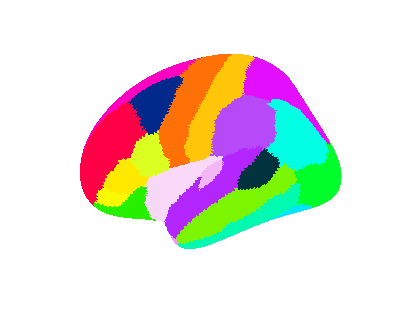

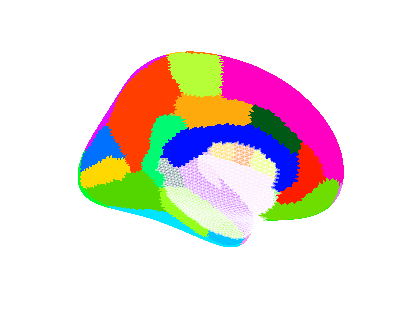

In [10]:
fig = plot_surf_roi([lhi_vtx,lhi_tri], lh_annot[0], view='lateral', hemi='left');

fig = plot_surf_roi([lhi_vtx,lhi_tri], lh_annot[0], view='medial', hemi='left');


In [12]:
import numpy as np

In [13]:
newlabs = np.zeros_like(lh_annot[0])
newlabs[lh_annot[0]==11] = 1

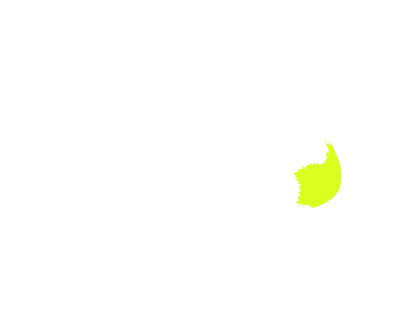

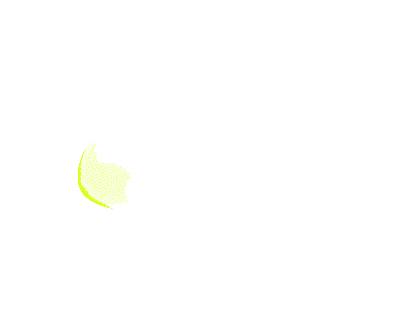

In [19]:
fig = plot_surf_roi([lhi_vtx,lhi_tri], newlabs, view='lateral', hemi='left',alpha=0.9);
fig = plot_surf_roi([lhi_vtx,lhi_tri], newlabs, view='medial', hemi='left',black_bg=True,darkness=-0.5)

In [ ]:
%%time


all_sims = {}

I_o_bg = 0.
I_o_focal = 2.0 #  1.4

for fn,fnn in zip(focal_nodes,focal_node_names):

    I_o_vec = np.ones(n_nodes_96) * I_o_bg
    I_o_vec[fn] = I_o_focal
    
    newparams = deepcopy(ssX_params)
    newparams['stim_nodes'] = focal_nodes
    newparams['I_o'] = I_o_vec
    newparams['weights'] = weights_96
    newparams['delays'] = delays_96
    newparams['K'] = n_nodes_96
    newparams['g'] = 0.9
    
    all_sims[fnn] = run_net_sim(**newparams)  

In [11]:
n_nodes_l2k8 = 68

# low resolution = sparser set ('short')
freqs_s = np.arange(0.01,100.,10./3.)
amps_s = np.arange(0,3,0.1) 

# high resolution = denser set ('long')
freqs_l = np.arange(0,100,1)
amps_l = np.arange(0.,2.05,0.05)

# 1-node weights & delays
weights_1N = np.array([[1.]])
delays_1N = np.array([[1.]])


ssX_params = dict(I_o=0.,
             wee = 1.4,wei = 1.4,
                  wie = -2.,wii = -0.5,wertn = 0.6,weth = .6,
            wthi = 0.2,wthe = 1.65,wrtnth = -2.,wthrtn = 2.,D_e = .0001,D_i= .0001,
            D_th = 0.0001,D_rtn = 0.0001,T = 1024,P=1,Q = 1,Dt = 0.001,
            dt = 0.1,gain = 20.,threshold = 0.,Pi = 3.14159,g = -0.9,a_e = 0.3,
            a_i = 0.5,a_th = 0.2,a_rtn = 0.2,i_e = -0.35,i_i = -0.3,i_th = 0.5,
            i_rtn = -0.8,tau1  = 20.,tau2 = 5.,T_transient=1000,
            stim_freq=35.,stim_amp=0.5,
             weights=weights_1N,delays=delays_1N,K=1,
             return_ts=True,compute_connectivity=False,#True,
             stim_type='sinewave',stim_pops=['e'])

In [19]:
%%time


l2k8_lV1_idx = 10

l2k8_LO_idx = 11

l2k8_lV1_idx = 10

l2k8_lM1_idx = 29
l2k8_lA1_idx = 38
l2k8_lS1_idx = 47
l2k8_lDLPFC_idx = 56
l2k8_lVLPFC_idx = 65

l2k8_parsop_idx = 18
l2k8_parsorb_idx = 19
l2k8_parstri_idx = 20


focal_nodes = [l2k8_lV1_idx,l2k8_LO_idx,l2k8_lA1_idx,l2k8_lM1_idx,l2k8_lS1_idx,
               l2k8_lDLPFC_idx,l2k8_lVLPFC_idx,
               l2k8_parsop_idx,l2k8_parsorb_idx,l2k8_parstri_idx]
focal_node_names = ['lV1','LO', 'lA1','lM1','lS1','lDLPFC','lVLPFC',
                    'lparsop','lparsorb', 'lparstri']


all_sims = {}

I_o_bg = 0.
I_o_focal = 2.0 #  1.4

for fn,fnn in zip(focal_nodes,focal_node_names):

    I_o_vec = np.ones(n_nodes_l2k8) * I_o_bg
    I_o_vec[fn] = I_o_focal
    
    newparams = deepcopy(ssX_params)
    newparams['stim_nodes'] = focal_nodes
    newparams['I_o'] = I_o_vec
    newparams['weights'] = _df_w.values
    newparams['delays'] = _df_d.values
    newparams['K'] = n_nodes_l2k8
    newparams['g'] = 0.9
    
    all_sims[fnn] = run_net_sim(**newparams)  

CPU times: user 12min 25s, sys: 312 ms, total: 12min 25s
Wall time: 12min 25s


In [20]:
# FRIDAY 11AM UP TO HERE. 

# RUNNING MORE SIMS TO SEE IF STIM STUFF LOOKS BETTER FOR DIFFERENT REGIONS. 

# WHEN FINISHED, DO SOME MORE BRAIN PLOTS AS BELOW. 

In [96]:
ssX_params_new = dict(I_o=0.,wee=0.5,wei=1.0,wie=-2.0,wii=-0.1, 
                     wertn=2.8,weth=0.3,wthi=0.2,wthe=1.65,wrtnth=-1.5,wthrtn=1.5, 
                     D_e=  .00001,D_i=  .00001, D_th= .00001,D_rtn=0.0001,
                     T =  1024*4, T_transient = 1000, Q = 1,
                     Dt  = 0.001,dt =  0.1,gain = 25,threshold = 0.,
                     Pi =  3.14159, 
                      g =  20.0,
                      a_e = 0.25,#0.75,
                      a_i  =  0.25, #0.75,
                      a_th = 0.15,
                     a_rtn = 0.15,
                     i_e = -0.65, i_i = -0.2,
                     i_th =  0.1,i_rtn = -0.2, # -0.4,
                     tau1 = 30, tau2 = 10,
                     stim_amp=0,
                     weights=_df_w.values ,#_df.values,#df_l2k8_wlog_divmax.values, #df_l2k8_wlog_4bin.values, 
                      delays = _df_d.values, K=83,#96,
                      return_ts=True,compute_connectivity=True)


In [ ]:
%%time


all_sims = {}

I_o_bg = 0.
I_o_focal = 2.0 #  1.4

for fn,fnn in zip(focal_nodes,focal_node_names)[:1]:

    I_o_vec = np.ones(n_nodes_l2k8) * I_o_bg
    I_o_vec[fn] = I_o_focal
    
    newparams = deepcopy(ssX_params_new)
    newparams['stim_nodes'] = focal_nodes
    newparams['I_o'] = I_o_vec
    newparams['weights'] = weights_l2k8
    newparams['delays'] = delays_l2k8
    newparams['K'] = n_nodes_l2k8
    newparams['g'] = 0.9
    
    all_sims[fnn] = run_net_sim(**newparams)  
    
    
newparams = deepcopy(ssX_params_new)
newparams['weights'] = weights_l2k8
newparams['delays'] = delays_l2k8
newparams['K'] = n_nodes_l2k8
newparams['g'] = 0.9

newparams['I_o'] = 0.

ref_sim = run_net_sim(**newparams)  



newparams = deepcopy(ssX_params_new)
newparams['weights'] = weights_l2k8
newparams['delays'] = delays_l2k8
newparams['K'] = n_nodes_l2k8
newparams['g'] = 0.9

newparams['I_o'] = 0.

ref_sim_2 = run_net_sim(**newparams)  

In [145]:
all_sims[k][1]['e'].index.values

array([  0.     ,   3.90625,   7.8125 ,  11.71875,  15.625  ,  19.53125,
        23.4375 ,  27.34375,  31.25   ,  35.15625,  39.0625 ,  42.96875,
        46.875  ,  50.78125,  54.6875 ,  58.59375,  62.5    ,  66.40625,
        70.3125 ,  74.21875,  78.125  ,  82.03125,  85.9375 ,  89.84375,
        93.75   ,  97.65625, 101.5625 , 105.46875, 109.375  , 113.28125,
       117.1875 , 121.09375, 125.     , 128.90625, 132.8125 , 136.71875,
       140.625  , 144.53125, 148.4375 , 152.34375, 156.25   , 160.15625,
       164.0625 , 167.96875, 171.875  , 175.78125, 179.6875 , 183.59375,
       187.5    , 191.40625, 195.3125 , 199.21875, 203.125  , 207.03125,
       210.9375 , 214.84375, 218.75   , 222.65625, 226.5625 , 230.46875,
       234.375  , 238.28125, 242.1875 , 246.09375, 250.     , 253.90625,
       257.8125 , 261.71875, 265.625  , 269.53125, 273.4375 , 277.34375,
       281.25   , 285.15625, 289.0625 , 292.96875, 296.875  , 300.78125,
       304.6875 , 308.59375, 312.5    , 316.40625, 

In [146]:
gammafreq = 23.4375 # 35.15625
gammapow = pd.DataFrame(np.squeeze(all_sims[k][1]['e'].loc[gammafreq].values))[0]
gammapow_onsurf = alphapow[rm_l2k8_lhrh]

alphafreq = 11.71875
alphafreq2 = 7.8125
alphapow = pd.DataFrame(np.squeeze(all_sims[k][1]['e'].loc[alphafreq].values))[0]
alphapow_onsurf = alphapow[rm_l2k8_lhrh]

In [154]:
from scipy.signal import welch

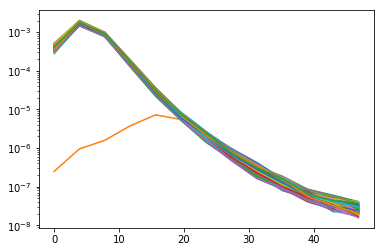

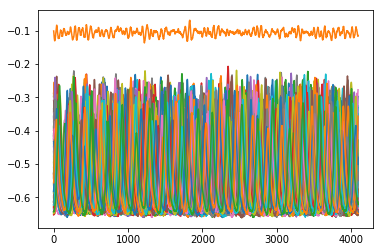

In [176]:
ats = all_sims[k][0]['e']
stuff=welch(ats.T,fs=1000)
apsd = pd.DataFrame(stuff[1].T, index=stuff[0])
apsd.loc[:50].plot(legend=False,logy=True)

ats.plot(legend=False)

ats_norm = ats / ats.mean()
stuff=welch(ats_norm.T,fs=1000)
apsd_norm = pd.DataFrame(stuff[1].T, index=stuff[0])
apsd_norm.loc[:50].plot(legend=False,logy=True)

In [206]:
gammafreq = 23.4375 # 35.15625
gammapow_norm = apsd_norm.loc[gammafreq]
gammapow_norm_onsurf = gammapow_norm.values[rm_l2k8_lhrh]

alphafreq = 11.71875
alphafreq2 = 7.8125
alphapow_norm = apsd_norm.loc[alphafreq2]
alphapow_norm_onsurf = alphapow_norm.values[rm_l2k8_lhrh]

In [207]:
alphapow_norm_divmax = alphapow_norm / alphapow_norm.max()
gammapow_norm_divmax = gammapow_norm / gammapow_norm.max()

alphapow_norm_divmax_onsurf = alphapow_norm_divmax.values[rm_l2k8_lhrh]
gammapow_norm_divmax_onsurf = gammapow_norm_divmax.values[rm_l2k8_lhrh]

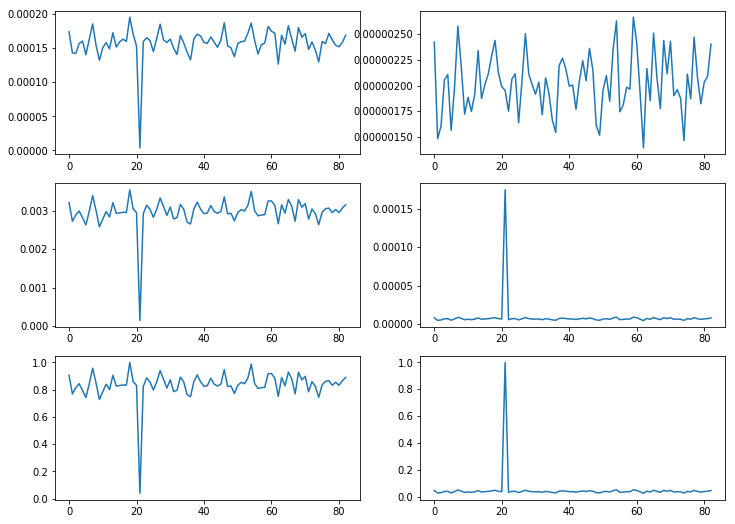

In [208]:
fig, ax = plt.subplots(ncols=2, nrows=3,figsize=(12,9))

alphapow.plot(ax=ax[0][0])#,legend=False)
gammapow.plot(ax=ax[0][1])#,legend=False)

alphapow_norm.plot(ax=ax[1][0])#,legend=False)
gammapow_norm.plot(ax=ax[1][1])#,legend=False)

alphapow_norm_divmax.plot(ax=ax[2][0])#,legend=False)
gammapow_norm_divmax.plot(ax=ax[2][1])#,legend=False)

GOOD. THESE ARE EXACTLY THE POWER FIGS I WANT TO SEE. 

NOW DO FOR SOME OTHER REGIONS. THE VISUAL CORTEX ONE HERE DOESN'T REALLY WORK. 

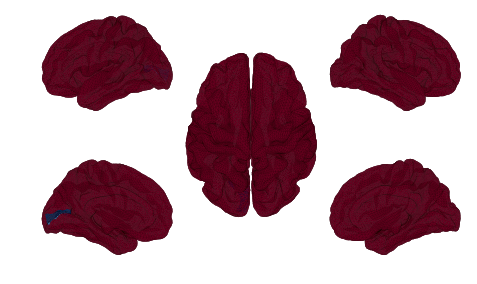

In [209]:
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmin': 0.6,'vmax': 0.7, 'alpha': None, 'linewidth': 0.05}

plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=hemi,reorient='fs',
                    data=alphapow_norm_divmax_onsurf,
                    shade_kwargs=kws)                    

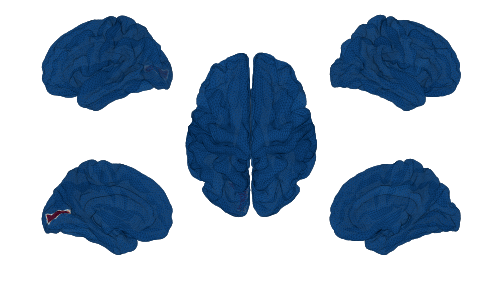

In [198]:
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmin': 0.0,'vmax': 1., 'alpha': None, 'linewidth': 0.05}

plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=hemi,reorient='fs',
                    data=gammapow_norm_divmax_onsurf,
                    shade_kwargs=kws)                    

In [ ]:
alphafreq = 11.71875
alphafreq2 = 7.8125

alphafreq = alphafreq2

    
#fIo_alpha = pd.DataFrame(np.squeeze(all_sims['lV1'][1]['e'].loc[alphafreq].values),index=conn96_cortical.region_labels)[0]
fIo_alpha = pd.DataFrame(np.squeeze(all_sims['lV1'][1]['e'].loc[alphafreq].values))[0]
#ref_alpha = pd.DataFrame(np.squeeze(ref_sim[1]['e'].loc[alphafreq].values),index=conn96_cortical.region_labels)[0]
ref_alpha = pd.DataFrame(np.squeeze(ref_sim[1]['e'].loc[alphafreq].values))[0]
ref_sub_fIo_alpha = ref_alpha - fIo_alpha


gammafreq = 35.15625
            
#fIo_gamma = pd.DataFrame(np.squeeze(all_sims['lV1'][1]['e'].loc[gammafreq].values),index=conn96_cortical.region_labels)[0]
fIo_gamma = pd.DataFrame(np.squeeze(all_sims['lV1'][1]['e'].loc[gammafreq].values))[0]
#ref_gamma = pd.DataFrame(np.squeeze(ref_sim[1]['e'].loc[gammafreq].values),index=conn96_cortical.region_labels)[0]
ref_gamma = pd.DataFrame(np.squeeze(ref_sim[1]['e'].loc[gammafreq].values))[0]
ref_sub_fIo_gamma = ref_gamma - fIo_gamma



                         

fIo_ts = all_sims['lV1'][0]['e'].copy()
#fIo_ts.columns = conn96_cortical.region_labels
#fIo_ts.columns = conn96_cortical.region_labels
#fIo_ts_z = pd.DataFrame(zscore(fIo_ts,axis=0),columns=fIo_ts.columns,index=fIo_ts.index)
fIo_ts_z = pd.DataFrame(zscore(fIo_ts,axis=0),columns=fIo_ts.columns,index=fIo_ts.index)

ref_ts = ref_sim[0]['e'].copy()
#ref_ts.columns = conn96_cortical.region_labels
#ref_ts_z = pd.DataFrame(zscore(ref_ts,axis=0),columns=ref_ts.columns,index=ref_ts.index)
ref_ts_z = pd.DataFrame(zscore(ref_ts,axis=0),columns=ref_ts.columns,index=ref_ts.index)

fIo_ps = all_sims['lV1'][1]['e'].loc[:100].copy()
#fIo_ps.columns = conn96_cortical.region_labels

ref_ps = ref_sim[1]['e'].loc[:100].copy()
#ref_ps.columns = conn96_cortical.region_labels


fIo_ps_alpha = fIo_ps.loc[alphafreq]
fIo_ps_gamma = fIo_ps.loc[gammafreq]

ref_ps_alpha = ref_ps.loc[alphafreq]
ref_ps_gamma = ref_ps.loc[gammafreq]


# norm by nodes

fIo_ps_nbn = fIo_ps / fIo_ps.abs().mean(axis=0)
ref_ps_nbn = ref_ps / ref_ps.abs().mean(axis=0)

fIo_ps_nbn_alpha = fIo_ps_nbn.loc[alphafreq]
fIo_ps_nbn_gamma = fIo_ps_nbn.loc[gammafreq]

ref_ps_nbn_alpha = ref_ps_nbn.loc[alphafreq]
ref_ps_nbn_gamma = ref_ps_nbn.loc[gammafreq]



# norm by freqs

fIo_ps_nbf = (fIo_ps.T - fIo_ps.T.abs().mean(axis=0)).T
ref_ps_nbf = (ref_ps.T - ref_ps.T.abs().mean(axis=0)).T

fIo_ps_nbf_alpha = fIo_ps_nbf.loc[alphafreq]
fIo_ps_nbf_gamma = fIo_ps_nbf.loc[gammafreq]

ref_ps_nbf_alpha = ref_ps_nbf.loc[alphafreq]
ref_ps_nbf_gamma = ref_ps_nbf.loc[gammafreq]



# ref sub fIo

ref_sub_fIo_ps = ref_ps - fIo_ps
ref_sub_fIo_ps_nbn = ref_ps_nbn - fIo_ps_nbn
ref_sub_fIo_ps_nbf = ref_ps_nbf - fIo_ps_nbf

ref_sub_fIo_ps_alpha = ref_sub_fIo_ps.loc[alphafreq]
ref_sub_fIo_ps_gamma = ref_sub_fIo_ps.loc[gammafreq]

ref_sub_fIo_ps_nbn_alpha = ref_sub_fIo_ps_nbn.loc[alphafreq]
ref_sub_fIo_ps_nbn_gamma = ref_sub_fIo_ps_nbn.loc[gammafreq]

ref_sub_fIo_ps_nbf_alpha = ref_sub_fIo_ps_nbf.loc[alphafreq]
ref_sub_fIo_ps_nbf_gamma = ref_sub_fIo_ps_nbf.loc[gammafreq]

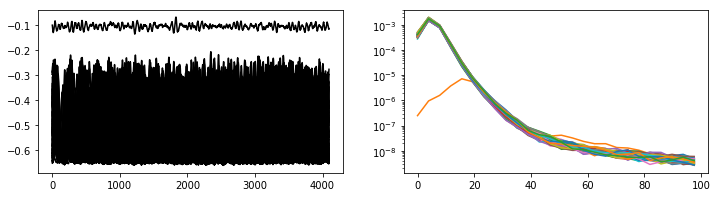

In [112]:
fig, ax  = plt.subplots(ncols=2,figsize=(12,3))

fIo_ts.plot(legend=False, c='k',ax=ax[0])

fIo_ps.loc[:100].plot(legend=False,logy=True,ax=ax[1])

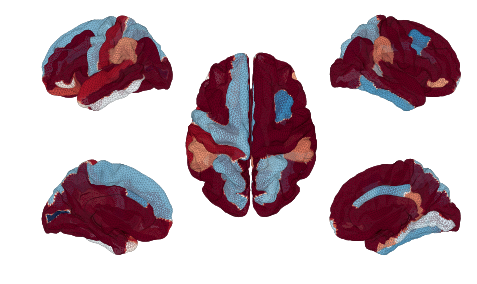

In [99]:
_cm = 'RdBu_r'
kws = {'edgecolors': 'k', 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 0.006,'vmin': 0.0, 'alpha': None, 'linewidth': 0.05}

plot_surface_mpl_mv(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,hemi=hemi,reorient='fs',
                    data=gammapow_onsurf,
                    shade_kwargs=kws) 

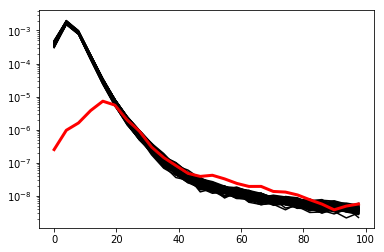

In [125]:
fig, ax = plt.subplots()

ref_ps.loc[:100].plot(ax=ax, c='k',legend=False)
fIo_ps[idx].loc[:100].plot(c='r', linewidth=3.,legend=False,logy=True,ax=ax)#,ax=ax[1],
fIo_ps.loc[:80].plot(c='k', alpha=0.01,linewidth=0.5,legend=False,logy=True,ax=ax)#,ax=ax[1],

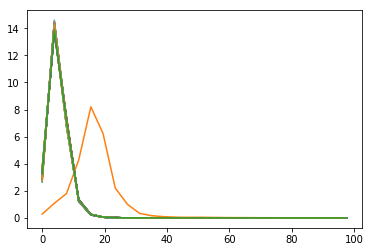

In [129]:
fIo_ps_nbn.plot(legend=False)

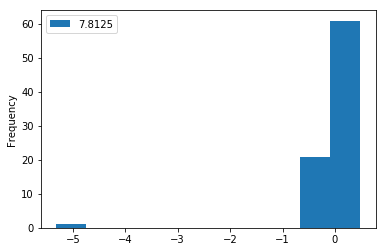

In [134]:
dat = -ref_sub_fIo_ps_nbn_alpha
dat_onsurf = dat[rm_l2k8_lhrh]

pd.DataFrame(dat).plot(kind='hist')


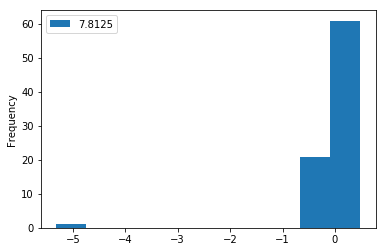

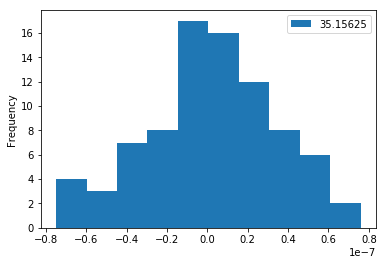

In [133]:
pd.DataFrame(dat).plot(kind='hist')

dat = -ref_sub_fIo_ps_gamma

pd.DataFrame(dat).plot(kind='hist')

WARNING  /hecuba/mcintosh_lab/john/VM_Software/miniconda2/envs/jupyter/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



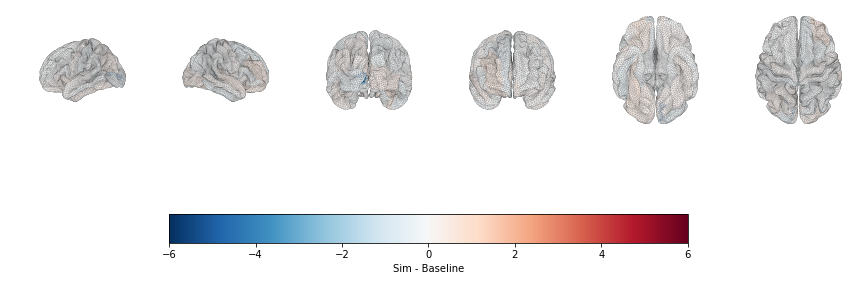

In [132]:
_cm = 'RdBu_r'

kws = {'edgecolors': 'k', 'vmin': -6., 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 6., 'alpha': None, 'linewidth': 0.05}
 
fig, ax  =plt.subplots(ncols=6, figsize=(12,4))

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='lh_lat',reorient='fs',ax=ax[0])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax[1])

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='anterior',reorient='fs',ax=ax[2])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='posterior',reorient='fs',ax=ax[3])

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='inferior',reorient='fs',ax=ax[4])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='superior',reorient='fs',ax=ax[5])

ax1 = fig.add_axes([0.2, -0.1, 0.6, 0.1])
norm = mpl.colors.Normalize(vmin=kws['vmin'], vmax=kws['vmax'])
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=kws['cmap'],norm=norm,orientation='horizontal')
cb1.set_label('Sim - Baseline')

plt.tight_layout()

In [135]:
dat = -ref_sub_fIo_ps_gamma
dat_onsurf = dat[rm_l2k8_lhrh]

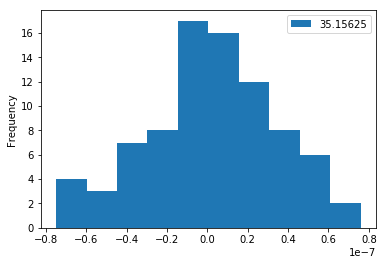

In [136]:
pd.DataFrame(dat).plot(kind='hist')

WARNING  /hecuba/mcintosh_lab/john/VM_Software/miniconda2/envs/jupyter/lib/python2.7/site-packages/matplotlib/figure.py:2299: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "



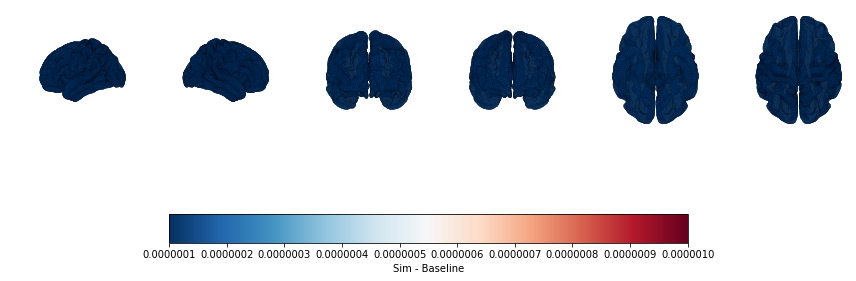

In [137]:
_cm = 'RdBu_r'

kws = {'edgecolors': 'k', 'vmin': 1e-7, 'cmap': _cm, #$ 'Reds_r', #RdBu_r', # jet', 
       'vmax': 1e-6, 'alpha': None, 'linewidth': 0.05}


fig, ax  =plt.subplots(ncols=6, figsize=(12,4))

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='lh_lat',reorient='fs',ax=ax[0])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='lh_med',reorient='fs',ax=ax[1])

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='anterior',reorient='fs',ax=ax[2])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='posterior',reorient='fs',ax=ax[3])

plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='inferior',reorient='fs',ax=ax[4])
plot_surface_mpl(vtx=vtx_l2k8_lhrh,tri=tri_l2k8_lhrh,data=dat_onsurf,shade_kwargs=kws,view='superior',reorient='fs',ax=ax[5])

ax1 = fig.add_axes([0.2, -0.1, 0.6, 0.1])
norm = mpl.colors.Normalize(vmin=kws['vmin'], vmax=kws['vmax'])
cb1 = mpl.colorbar.ColorbarBase(ax1, cmap=kws['cmap'],norm=norm,orientation='horizontal')
cb1.set_label('Sim - Baseline')

plt.tight_layout()

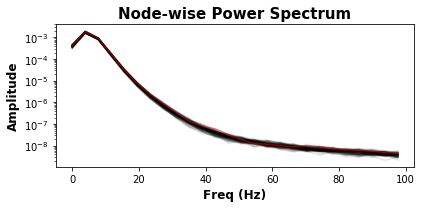

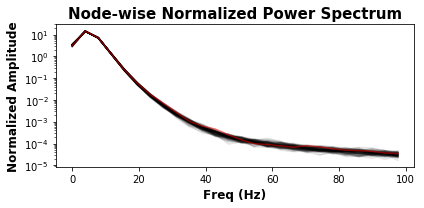

In [105]:
idx = 21

f = 'ref_ps__power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

ref_ps.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
ref_ps[idx].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))


# ---


f = 'ref_ps_nbn__normalized_power_spectrum.png'

fig, ax = plt.subplots(figsize=(6,3))

ref_ps_nbn.plot(legend=False,logy=True,c='k',alpha=0.1,ax=ax)
ref_ps_nbn[idx].plot(legend=False,logy=True,c='r', alpha=0.5,ax=ax)

ax.set_xlabel('Freq (Hz)',fontweight='bold',fontsize=12)
ax.set_ylabel('Normalized Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Node-wise Normalized Power Spectrum',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))

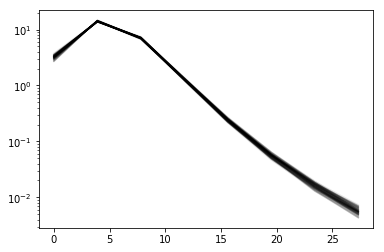

In [107]:
ref_ps_nbn.loc[:30].plot(legend=False,logy=True,c='k',alpha=0.1)

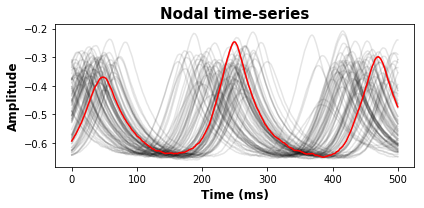

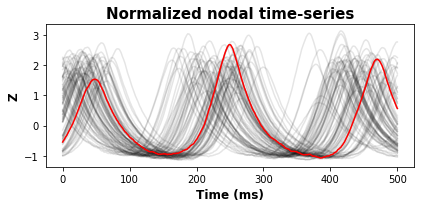

In [101]:
# ---


f = 'ref_ts.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

ref_ts.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
ref_ts.loc[:500][idx].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Amplitude',fontweight='bold',fontsize=12)
ax.set_title('Nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))


# ---


f = 'ref_ts_z.png'

fig, ax = plt.subplots(figsize=(6,3))

#fIo_ts_divmean.loc[:1000].plot(legend=False,c='k',ax=ax,alpha=0.5)
#fIo_ts_divmean['RM-V1_L'].loc[:1000].plot(legend=False,c='r',ax=ax,secondary_y=False)

ref_ts_z.loc[:500].plot(legend=False,c='k', alpha=0.1,ax=ax)
ref_ts_z.loc[:500][idx].plot(legend=False,c='r', ax=ax)

ax.set_xlabel('Time (ms)',fontweight='bold',fontsize=12)
ax.set_ylabel('Z',fontweight='bold',fontsize=12)
ax.set_title('Normalized nodal time-series',fontweight='bold', fontsize=15)

plt.tight_layout()
#plt.savefig(f, bbox_inches='tight', transparent=True,dpi=600)
#plt.close()

#display(Image(f,width=500))